## Looking for the right neighborhood to move in Chicago?

In [2]:
%%html
<img src="Pictures/Intro.png", width = 1000, height = 600>

#### Chicago is considered one of the most popular cities in the US. This case study targets to support „young families“ willing to move to Chicago by finding a suitable neighborhood. 

In [3]:
%%html
<img src="Pictures/family.png", width = 300, height = 300>

#### Target Audience: 
##### Young families (professionals) looking for a safe environment to grow up their children, close to schools, but at the same time having the flexibility to chose places closed to their interests (e.g. sport, restaurants etc.)

In [4]:
%%html
<img src="Pictures/criteria.png", width = 600, height = 300>

#### Criteria
##### The assumed criteria are:
1. Low criminality - Neighborhoods with a high criminality rate meaning high number of assaults but also sexual crimes will be considered as not safe. On the fist step, I would like to provide transparency about the crime situation in Chicago (e.g. trend, type of crimes, areas and hot-spots) to the target audience in oder to argument their choice.
2. Schools with good ratings will be shown as additional information for the choice. The user (target audience) will obtain ratings containing top schools and also schools with a bad rating. Combined with the information about criminality, the user will have the chance to start picking the areas of interest. At the end of this section, the user will get a list of locations with top rated public schools excluding areas with higher frequency of crimes.
3. The remaining neighborhoods (pre-selection according to the criteria above) will be clustered according to similar locations e.g. restaurants, fitness, entertainment etc. The user will obtain clusters of neighborhoods which have similar venues.

The analysis is divided into 3 parts. For the target audience (young families) there were 3 relevant criteria to choose where to live. generate a pre-selection of potential neighbourhoods based on the criteria mentioned above. Disadvantages (like criminality) as well as advantages (top public schools with ratings and amenities) will be then shown to enable the stakeholders of this project to make the best choice. 

In [2]:
import pandas as pd

import numpy as np

import requests

## Criteria # 1: Analysis on criminality in Chicago

### 1. Data Sources Nr.1: Chicago Crime data from 2001 to present
This dataset reflects reported incidents of crime (with the exception of murders where data exists for each victim) that occurred in the City of Chicago from 2001 to present, minus the most recent seven days. Data is extracted from the Chicago Police Department's CLEAR (Citizen Law Enforcement Analysis and Reporting) system. Source: https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-present/ijzp-q8t2

In summary : This dataset contains the type of crime, location, Sub Category of the Crime,year and whether an arrest took place or not. This information will be used to provide the user with analysis at glance about the topic crime in Chicago and potential neighborhoods he/she should avoid.

In [3]:
# Importing the data
chicago_crime_df = pd.read_csv ('Crimes_-_2001_to_present.csv')
chicago_crime_df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,12026980,JD205512,03/26/2020 12:00:00 PM,004XX W PERSHING RD,1206,DECEPTIVE PRACTICE,"THEFT BY LESSEE, MOTOR VEHICLE",COMMERCIAL / BUSINESS OFFICE,False,False,...,11.0,61.0,11,NaN,NaN,2020,04/10/2020 03:47:54 PM,NaN,NaN,NaN
1,12022939,JD201040,04/03/2020 11:40:00 AM,017XX W 47TH ST,1310,CRIMINAL DAMAGE,TO PROPERTY,BANK,False,False,...,15.0,61.0,14,1165336.0,1873531.0,2020,04/10/2020 03:47:54 PM,41.808564,-87.669106,"(41.808564273, -87.669106152)"
2,12024662,JD202937,04/03/2020 10:00:00 PM,031XX S WESTERN AVE,0460,BATTERY,SIMPLE,STREET,False,False,...,25.0,31.0,08B,1160938.0,1884070.0,2020,04/10/2020 03:47:54 PM,41.837577,-87.684945,"(41.837576666, -87.684945388)"
3,12022867,JD200881,04/03/2020 07:45:00 AM,024XX W POPE JOHN PAUL II DR,141A,WEAPONS VIOLATION,UNLAWFUL USE - HANDGUN,APARTMENT,False,False,...,15.0,58.0,15,1160631.0,1876084.0,2020,04/10/2020 03:47:54 PM,41.815669,-87.686293,"(41.815668509, -87.686292611)"
4,12023185,JD201388,04/03/2020 06:25:00 PM,043XX S TALMAN AVE,1320,CRIMINAL DAMAGE,TO VEHICLE,STREET,False,False,...,15.0,58.0,14,1159423.0,1875798.0,2020,04/10/2020 03:47:54 PM,41.814909,-87.690732,"(41.814908564, -87.690731646)"


In [4]:
chicago_crime_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 350592 entries, 0 to 350591
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    350592 non-null  int64  
 1   Case Number           350592 non-null  object 
 2   Date                  350592 non-null  object 
 3   Block                 350592 non-null  object 
 4   IUCR                  350592 non-null  object 
 5   Primary Type          350592 non-null  object 
 6   Description           350592 non-null  object 
 7   Location Description  350471 non-null  object 
 8   Arrest                350592 non-null  bool   
 9   Domestic              350592 non-null  bool   
 10  Beat                  350592 non-null  int64  
 11  District              350592 non-null  int64  
 12  Ward                  319660 non-null  float64
 13  Community Area        319629 non-null  float64
 14  FBI Code              350592 non-null  object 
 15  

In [5]:
chicago_crime_2020 = pd.read_csv('Crimes_-_2020.csv')
chicago_crime_2020.shape

(56522, 22)

In [6]:
chicago_crime_df = chicago_crime_df.append(chicago_crime_2020, ignore_index = True)
chicago_crime_df.shape

(407114, 22)

### 1a. Data Preprocessing

#### This section will be used to remove unnecessary information, change data formats, enable visualization and complete the dataset by adding ZIP Codes and name of the areas (which are not available in the original data file) 

#### Dropping empty rows
As shown with the info(), there are some rows with missing values. Especially for Latitute and Longitue we need all the available values as well as for the community area identifier (identifier to join with our second dataset). We remove these rows using the following line.

In [7]:
cols = ['Latitude', 'Longitude','Community Area']
chicago_crime_df.dropna(axis=0, subset=cols, inplace = True)

In [8]:
chicago_crime_df.shape

(373174, 22)

#### Removing columns not needed for the analysis
The data source offers several information. However, only part of it will be used for the case. I will removed the non-relevant columns from my dataframe to increase the transparency.

In [9]:
columns = ['FBI Code', 'X Coordinate', 'Y Coordinate', 'Updated On', 'IUCR'] 
chicago_crime_df.drop(columns, axis = 1, inplace = True)

chicago_crime_df.shape

(373174, 17)

#### Creating a table for the join with the crime dataframe which does not contain the name of the areas or the zip code 
The public schools table contains all the ZIP codes and communiy areas. The latter can be used to fill the zip codes and community area names missing in the crime tables.

In [10]:
public_schools_df= pd.read_csv ('Chicago_Public_Schools.csv')
public_schools_df.head()

,School ID,Name of School,"Elementary, Middle, or High School",Street Address,City,State,ZIP Code,Phone Number,Link,Network Manager,...,RCDTS Code,X_COORDINATE,Y_COORDINATE,Latitude,Longitude,Community Area Number,Community Area Name,Ward,Police District,Location
0,609966,Charles G Hammond Elementary School,ES,2819 W 21st Pl,Chicago,IL,60623,(773) 535-4580,http://schoolreports.cps.edu/SchoolProgressRep...,Pilsen-Little Village Elementary Network,...,150000000000000,1157809.015,1889554.623,41.852691,-87.696278,30,SOUTH LAWNDALE,12,10,"(41.85269133, -87.69627777)"
1,610539,Marvin Camras Elementary School,ES,3000 N Mango Ave,Chicago,IL,60634,(773) 534-2960,http://schoolreports.cps.edu/SchoolProgressRep...,Fullerton Elementary Network,...,150000000000000,1137482.296,1919394.900,41.934966,-87.770165,19,BELMONT CRAGIN,30,25,"(41.93496641, -87.77016525)"
2,609852,Eliza Chappell Elementary School,ES,2135 W Foster Ave,Chicago,IL,60625,(773) 534-2390,http://schoolreports.cps.edu/SchoolProgressRep...,Ravenswood-Ridge Elementary Network,...,150000000000000,1161016.902,1934466.545,41.975867,-87.683254,4,LINCOLN SQUARE,47,20,"(41.975867, -87.68325438)"
3,609835,Daniel R Cameron Elementary School,ES,1234 N Monticello Ave,Chicago,IL,60651,(773) 534-4290,http://schoolreports.cps.edu/SchoolProgressRep...,Garfield-Humboldt Elementary Network,...,150000000000000,1151767.546,1908130.068,41.903785,-87.717963,23,HUMBOLDT PARK,26,25,"(41.90378521, -87.71796315)"
4,610521,Sir Miles Davis Magnet Elementary Academy,ES,6730 S Paulina St,Chicago,IL,60636,(773) 535-9120,http://schoolreports.cps.edu/SchoolProgressRep...,Englewood-Gresham Elementary Network,...,150000000000000,1166133.893,1859929.018,41.771222,-87.666567,67,WEST ENGLEWOOD,15,7,"(41.77122181, -87.66656657)"


I will use this dataset later in section: Schools in Chicago

In [11]:
public_schools_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 79 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   School ID                                          566 non-null    int64  
 1   Name of School                                     566 non-null    object 
 2   Elementary, Middle, or High School                 566 non-null    object 
 3   Street Address                                     566 non-null    object 
 4   City                                               566 non-null    object 
 5   State                                              566 non-null    object 
 6   ZIP Code                                           566 non-null    int64  
 7   Phone Number                                       566 non-null    object 
 8   Link                                               565 non-null    object 
 9   Network Ma

In [12]:
# Rename column for joining with the crime table
public_schools_df.rename(columns = {'Community Area Number':'Community Area'}, inplace = True)
public_schools_df.rename(columns = {'Community Area Name':'Neighborhood'}, inplace = True)

In [15]:
cols1 = ['ZIP Code', 'Community Area', 'Neighborhood', 'Ward', 'Police District']
zip_table_df = public_schools_df[cols1]

In [16]:
# Here I just want to control whether I have information about the 77 community areas of Chicago as described in the official portal.
print("zip Codes:",zip_table_df['ZIP Code'].nunique())
print("Community Area:",zip_table_df['Community Area'].nunique())
print("Neighborhoods:",zip_table_df['Neighborhood'].nunique())
print("Ward:",zip_table_df['Ward'].nunique())
print("Police District:",zip_table_df['Police District'].nunique())

zip Codes: 51
Community Area: 77
Neighborhoods: 77
Ward: 50
Police District: 23


In [17]:
# merge the 2 tables
ext_chicago_crime_df = pd.merge(chicago_crime_df,zip_table_df, on = 'Community Area', how ='left')

In [18]:
ext_chicago_crime_df.head()

,ID,Case Number,Date,Block,Primary Type,Description,Location Description,Arrest,Domestic,Beat,...,Ward_x,Community Area,Year,Latitude,Longitude,Location,ZIP Code,Neighborhood,Ward_y,Police District
0,12022939,JD201040,04/03/2020 11:40:00 AM,017XX W 47TH ST,CRIMINAL DAMAGE,TO PROPERTY,BANK,False,False,931,...,15.0,61.0,2020,41.808564,-87.669106,"(41.808564273, -87.669106152)",60609,NEW CITY,16,9
1,12022939,JD201040,04/03/2020 11:40:00 AM,017XX W 47TH ST,CRIMINAL DAMAGE,TO PROPERTY,BANK,False,False,931,...,15.0,61.0,2020,41.808564,-87.669106,"(41.808564273, -87.669106152)",60609,NEW CITY,3,9
2,12022939,JD201040,04/03/2020 11:40:00 AM,017XX W 47TH ST,CRIMINAL DAMAGE,TO PROPERTY,BANK,False,False,931,...,15.0,61.0,2020,41.808564,-87.669106,"(41.808564273, -87.669106152)",60609,NEW CITY,16,9
3,12022939,JD201040,04/03/2020 11:40:00 AM,017XX W 47TH ST,CRIMINAL DAMAGE,TO PROPERTY,BANK,False,False,931,...,15.0,61.0,2020,41.808564,-87.669106,"(41.808564273, -87.669106152)",60609,NEW CITY,16,9
4,12022939,JD201040,04/03/2020 11:40:00 AM,017XX W 47TH ST,CRIMINAL DAMAGE,TO PROPERTY,BANK,False,False,931,...,15.0,61.0,2020,41.808564,-87.669106,"(41.808564273, -87.669106152)",60609,NEW CITY,20,9


In [19]:
ext_chicago_crime_df.shape

(3371750, 21)

In [20]:
# After merging, I have created some duplicate rows, that needs to be removed
# Remove added columns with no values
ext_chicago_crime_df.sort_values("ID", inplace = True) 

# dropping ALL duplicte values 
ext_chicago_crime_df.drop_duplicates(subset ="ID",keep = 'first', inplace = True) 


In [21]:
ext_chicago_crime_df.shape

(370741, 21)

### Formatting values for a later visualization
Some columns has been parsed as float datatype. For visually more pleasing labels, I will first convert them to integers again, before making them categorical. These are for locations and also the type of crimes.

In [22]:
# Date not needed for the moment
#ext_chicago_crime_df['Date'] = ext_chicago_crime_df['Date'].astype('datetime64[ns]')

In [23]:
ext_chicago_crime_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 370741 entries, 1860132 to 2797546
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    370741 non-null  int64  
 1   Case Number           370741 non-null  object 
 2   Date                  370741 non-null  object 
 3   Block                 370741 non-null  object 
 4   Primary Type          370741 non-null  object 
 5   Description           370741 non-null  object 
 6   Location Description  370462 non-null  object 
 7   Arrest                370741 non-null  bool   
 8   Domestic              370741 non-null  bool   
 9   Beat                  370741 non-null  int64  
 10  District              370741 non-null  int64  
 11  Ward_x                370740 non-null  float64
 12  Community Area        370741 non-null  float64
 13  Year                  370741 non-null  int64  
 14  Latitude              370741 non-null  float6

In [24]:
# Other categories currently parsed as object type
for categorical_column in ['Primary Type','Description', 'Location Description', 'Arrest', 'Domestic', 'Neighborhood']:
    ext_chicago_crime_df[categorical_column] = ext_chicago_crime_df[categorical_column].astype('category')

In [25]:
  ext_chicago_crime_df.rename(columns = {'Primary Type':'Primary_Type'}, inplace = True)

In [26]:
ext_chicago_crime_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 370741 entries, 1860132 to 2797546
Data columns (total 21 columns):
 #   Column                Non-Null Count   Dtype   
---  ------                --------------   -----   
 0   ID                    370741 non-null  int64   
 1   Case Number           370741 non-null  object  
 2   Date                  370741 non-null  object  
 3   Block                 370741 non-null  object  
 4   Primary_Type          370741 non-null  category
 5   Description           370741 non-null  category
 6   Location Description  370462 non-null  category
 7   Arrest                370741 non-null  category
 8   Domestic              370741 non-null  category
 9   Beat                  370741 non-null  int64   
 10  District              370741 non-null  int64   
 11  Ward_x                370740 non-null  float64 
 12  Community Area        370741 non-null  float64 
 13  Year                  370741 non-null  int64   
 14  Latitude              370741 

### 1b. Get some insights about the crime in Chicago

### Typical areas for crimes

In [27]:
view = ext_chicago_crime_df.groupby('Location Description').count()[['ID']]
view.sort_values("ID", inplace = True, ascending = False)

view.head(10)

,ID
Location Description,
STREET,107233
RESIDENCE,64420
APARTMENT,41549
SIDEWALK,30053
OTHER,11493
PARKING LOT/GARAGE(NON.RESID.),11105
ALLEY,9023
RESIDENCE-GARAGE,8026
SMALL RETAIL STORE,6793


In [28]:
view_types = ext_chicago_crime_df.groupby(['Primary_Type']).count()[['ID']]
view_types.sort_values("ID", ascending = False, inplace = True)
view_types.head(10)

,ID
Primary_Type,
BATTERY,70800
THEFT,69511
CRIMINAL DAMAGE,47480
NARCOTICS,33633
ASSAULT,25271
BURGLARY,22073
OTHER OFFENSE,21976
MOTOR VEHICLE THEFT,19004
DECEPTIVE PRACTICE,13507


In [29]:
types = view_types.iloc[:,0]
print(types)

Primary_Type
BATTERY                              70800
THEFT                                69511
CRIMINAL DAMAGE                      47480
NARCOTICS                            33633
ASSAULT                              25271
BURGLARY                             22073
OTHER OFFENSE                        21976
MOTOR VEHICLE THEFT                  19004
DECEPTIVE PRACTICE                   13507
ROBBERY                              12944
CRIMINAL TRESPASS                     8806
WEAPONS VIOLATION                     6198
PROSTITUTION                          4687
PUBLIC PEACE VIOLATION                3437
OFFENSE INVOLVING CHILDREN            2964
SEX OFFENSE                           1706
CRIM SEXUAL ASSAULT                   1325
INTERFERENCE WITH PUBLIC OFFICER      1183
ARSON                                  898
LIQUOR LAW VIOLATION                   876
HOMICIDE                               743
GAMBLING                               579
KIDNAPPING                             31

In [30]:
view = ext_chicago_crime_df.groupby(['Year']).count()[['ID']]
view.head(25)

,ID
Year,
2001,184
2002,17799
2003,25143
2004,23597
2005,22709
2006,23346
2007,21643
2008,20651
2009,19069


#### I got a high number of observation for the year 2020 while for the other years the document is smaller (the original document has more than 7 million rows). The year 2020 can be used for visualizing the current locations while excluded for the trend analysis.

### 1c. Visualize the data
#### One of the first information the targeted audience would like to have is to know about the development of criminality in Chicago and assess whether it is the right time to move to the city.

#####  For the trend analyis I excluded 2001 due to the low number of cases due to data gaps.

In [31]:
mask = (ext_chicago_crime_df['Year'] > 2002) & (ext_chicago_crime_df['Year']  < 2020)
ext_chicago_crime_trend = ext_chicago_crime_df.loc[mask]

Text(0.5, 1.0, 'Number of Crime in Chicago over the years')

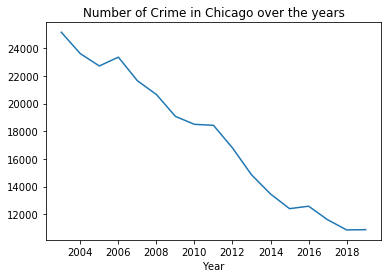

In [32]:
import matplotlib.pyplot as plt
view = ext_chicago_crime_trend.groupby(['Year']).count()[['ID']]

view.plot(kind ='line', legend = False)
plt.title("Number of Crime in Chicago over the years")

In [33]:
df = pd.pivot_table(data = ext_chicago_crime_trend, index= 'Year', columns = 'Primary_Type', values= "ID", aggfunc= [np.size])
df

size                                                             \
Primary_Type ARSON ASSAULT BATTERY BURGLARY CONCEALED CARRY LICENSE VIOLATION   
Year                                                                            
2003          88.0  1602.0  4616.0   1762.0                               NaN   
2004          57.0  1507.0  4387.0   1498.0                               NaN   
2005          60.0  1409.0  4474.0   1501.0                               NaN   
2006          43.0  1361.0  4215.0   1615.0                               NaN   
2007          55.0  1321.0  4069.0   1269.0                               NaN   
2008          50.0  1268.0  3872.0   1300.0                               NaN   
2009          50.0  1247.0  3462.0   1270.0                               NaN   
2010          33.0  1086.0  3404.0   1302.0                               NaN   
2011          55.0  1086.0  3271.0   1344.0                               NaN   
2012          27.0  1046.0  3090.0   1147.0                               NaN   
2013          29.0   908.0  2721.0    876.0                               NaN   
2014          38.0   857.0  2570.0    822.0                               NaN   
2015          39.0   851.0  2473.0    682.0                               2.0   
2016          35.0  1028.0  2560.0    780.0                               NaN   
2017          48.0   972.0  2303.0    638.0                               1.0   
2018          37.0   991.0  2200.0    576.0                               2.0   
2019          22.0   894.0  2184.0    525.0                               8.0   

                                                                          \
Primary_Type CRIM SEXUAL ASSAULT CRIMINAL DAMAGE CRIMINAL SEXUAL ASSAULT   
Year                                                                       
2003                        78.0          3265.0                     NaN   
2004                        70.0          3133.0                     NaN   
2005                        76.0          3226.0                     1.0   
2006                        77.0          3444.0                     NaN   
2007                        76.0          3174.0                     2.0   
2008                        78.0          2912.0                     NaN   
2009                        70.0          2584.0                     NaN   
2010                        71.0          2268.0                     NaN   
2011                        67.0          2399.0                     NaN   
2012                        58.0          2123.0                     NaN   
2013                        50.0          1732.0                     NaN   
2014                        55.0          1685.0                     NaN   
2015                        49.0          1547.0                     NaN   
2016                        62.0          1656.0                     NaN   
2017                        48.0          1425.0                     1.0   
2018                        61.0          1354.0                     3.0   
2019                        54.0          1394.0                     7.0   

                                                   ...  \
Primary_Type CRIMINAL TRESPASS DECEPTIVE PRACTICE  ...   
Year                                               ...   
2003                     603.0              612.0  ...   
2004                     559.0              557.0  ...   
2005                     534.0              571.0  ...   
2006                     604.0              576.0  ...   
2007                     548.0              531.0  ...   
2008                     516.0              518.0  ...   
2009                     493.0              440.0  ...   
2010                     386.0              459.0  ...   
2011                     368.0              567.0  ...   
2012                     343.0              692.0  ...   
2013                     362.0              536.0  ...   
2014                     319.0              599.0  ...   
20

array([[<matplotlib.axes._subplots.AxesSubplot object at 0x7f1ec26924e0>,
      dtype=object)

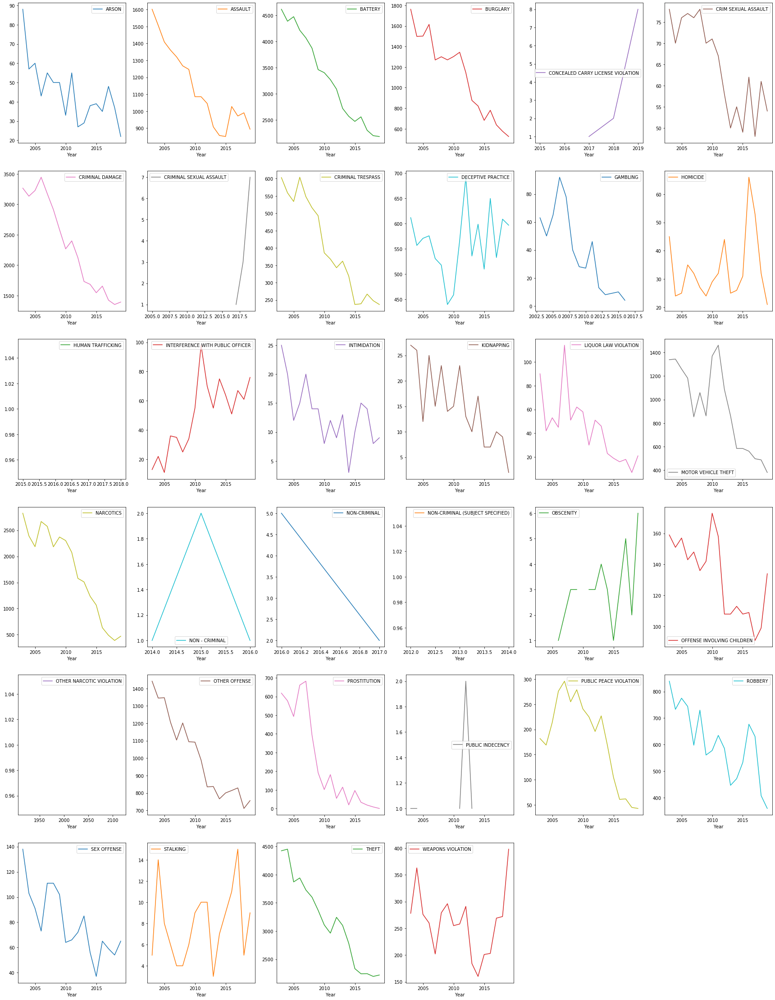

In [34]:
ext_chicago_crime_trend.pivot_table('ID', index='Year', columns='Primary_Type', aggfunc='count').plot(kind = 'line', figsize = (30,40), subplots = True, layout = (-1,6), sharex = False, sharey = False)

####  Not every type of crime is relevant for the trend, hence it needs to be filtered.

Text(0.5, 1.0, 'Development of crime frequency by crime types')

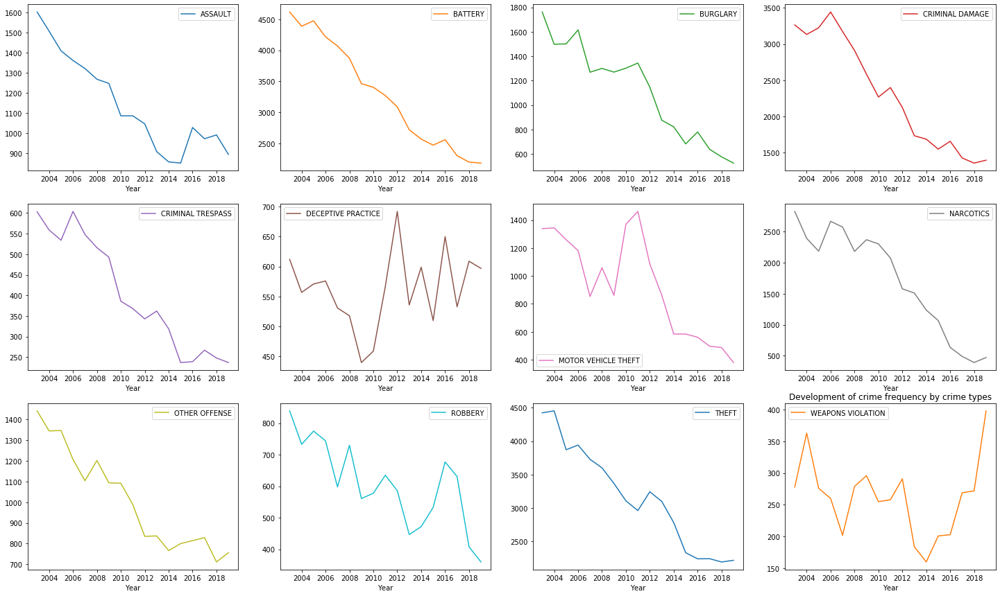

In [35]:
filter_list = ['THEFT','BATTERY', 'CRIMINAL DAMAGE', 'NARCOTICS','ASSAULT','BURGLARY', 'OTHER OFFENSE','MOTOR VEHICLE THEFT', 'DECEPTIVE PRACTICE', 'ROBBERY', 'CRIMINAL TRESPASS', 'WEAPONS VIOLATION']

ext_chicago_crime_trend = ext_chicago_crime_trend[ext_chicago_crime_trend.Primary_Type.isin(filter_list)]
ext_chicago_crime_trend.pivot_table('ID', index='Year', columns='Primary_Type', aggfunc='count').plot(kind = 'line', figsize = (25,15), subplots = True, layout = (-1,4), sharex = False, sharey = False)
plt.title("Development of crime frequency by crime types")

#### Let's take a look at the top areas and crime types

In [36]:
mask2 = (ext_chicago_crime_df['Year'] == 2020)
ext_chicago_crime_2020 = ext_chicago_crime_df.loc[mask2]
ext_chicago_crime_2020.shape

(56176, 21)

Text(0.5, 1.0, 'Top 10 Neighborhoods by number of delicts - year 2020')

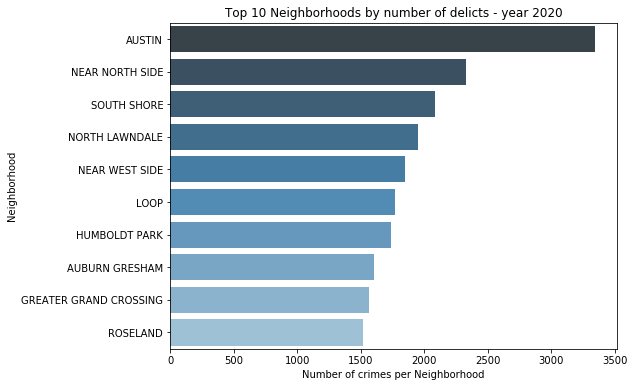

In [37]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize = (8, 6))
sns.countplot(y= 'Neighborhood',data = ext_chicago_crime_2020, order = ext_chicago_crime_2020['Neighborhood'].value_counts().iloc[:10].index, palette="Blues_d")
sns.set(style="darkgrid")
plt.xlabel("Number of crimes per Neighborhood")
plt.title("Top 10 Neighborhoods by number of delicts - year 2020")

####  Analysis of the type of crimes

In [38]:
Type_Crime = pd.pivot_table(data = ext_chicago_crime_trend, index= 'Neighborhood', columns = 'Primary_Type', values= "ID", aggfunc= [np.size])
Type_Crime.head()

size                                                     \
Primary_Type  ASSAULT BATTERY BURGLARY CRIMINAL DAMAGE CRIMINAL TRESPASS   
Neighborhood                                                               
ARMOUR SQUARE  1091.0  3315.0   1033.0          2616.0             974.0   
BRIDGEPORT     2660.0  6196.0   3204.0          6909.0             974.0   
BRIGHTON PARK  2965.0  9455.0   3822.0          7181.0             802.0   
CHICAGO LAWN      NaN     NaN      NaN             NaN               NaN   
DOUGLAS           NaN     2.0      NaN             3.0               2.0   

                                                                              \
Primary_Type  DECEPTIVE PRACTICE MOTOR VEHICLE THEFT NARCOTICS OTHER OFFENSE   
Neighborhood                                                                   
ARMOUR SQUARE             1622.0              1143.0    1162.0         889.0   
BRIDGEPORT                1515.0              1931.0    1672.0        2760.0   
BRIGHTON PARK             1522.0              3428.0    3950.0        3263.0   
CHICAGO LAWN                 1.0                 NaN       NaN           NaN   
DOUGLAS                      NaN                 2.0       8.0           2.0   

                                                 
Primary_Type  ROBBERY   THEFT WEAPONS VIOLATION  
Neighborhood                                     
ARMOUR SQUARE  1304.0  5858.0             153.0  
BRIDGEPORT      800.0  8142.0             250.0  
BRIGHTON PARK  1783.0  7234.0             780.0  
CHICAGO LAWN      NaN     NaN               NaN  
DOUGLAS           2.0     1.0               1.0

In [39]:
filter_list2 = ['THEFT','BATTERY', 'CRIMINAL DAMAGE', 'NARCOTICS','ASSAULT','BURGLARY', 'OTHER OFFENSE','MOTOR VEHICLE THEFT', 'DECEPTIVE PRACTICE']
ext_chicago_crime_trend = ext_chicago_crime_trend[ext_chicago_crime_trend.Primary_Type.isin(filter_list2)]
Type_Crime_Y = pd.pivot_table(data = ext_chicago_crime_trend, index= 'Year', columns = 'Primary_Type', values= "ID", aggfunc= [np.size])
Type_Crime_Y.head()

size                                                      \
Primary_Type ASSAULT BATTERY BURGLARY CRIMINAL DAMAGE DECEPTIVE PRACTICE   
Year                                                                       
2003            1602    4616     1762            3265                612   
2004            1507    4387     1498            3133                557   
2005            1409    4474     1501            3226                571   
2006            1361    4215     1615            3444                576   
2007            1321    4069     1269            3174                531   

                                                                
Primary_Type MOTOR VEHICLE THEFT NARCOTICS OTHER OFFENSE THEFT  
Year                                                            
2003                        1339      2827          1442  4424  
2004                        1344      2392          1345  4453  
2005                        1260      2186          1347  3872  
2006                        1182      2668          1207  3942  
2007                         853      2575          1104  3729

In [40]:
Type_Crime_Y.describe()

size                                            \
Primary_Type      ASSAULT      BATTERY     BURGLARY CRIMINAL DAMAGE   
count           17.000000    17.000000    17.000000       17.000000   
mean          1143.176471  3286.529412  1112.176471     2313.000000   
std            235.231863   854.236583   390.783865      758.850035   
min            851.000000  2184.000000   525.000000     1354.000000   
25%            972.000000  2560.000000   780.000000     1656.000000   
50%           1086.000000  3271.000000  1269.000000     2268.000000   
75%           1321.000000  4069.000000  1344.000000     3133.000000   
max           1602.000000  4616.000000  1762.000000     3444.000000   

                                                                  \
Primary_Type DECEPTIVE PRACTICE MOTOR VEHICLE THEFT    NARCOTICS   
count                 17.000000           17.000000    17.000000   
mean                 562.176471          927.705882  1703.411765   
std                   63.681076          362.778990   843.056942   
min                  440.000000          380.000000   390.000000   
25%                  531.000000          584.000000  1067.000000   
50%                  567.000000          862.000000  2076.000000   
75%                  599.000000         1260.000000  2371.000000   
max                  692.000000         1462.000000  2827.000000   

                                         
Primary_Type OTHER OFFENSE        THEFT  
count            17.000000    17.000000  
mean           1010.000000  3166.117647  
std             237.227739   763.417962  
min             711.000000  2195.000000  
25%             814.000000  2333.000000  
50%             989.000000  3109.000000  
75%            1202.000000  3729.000000  
max            1442.000000  4453.000000

In [41]:
Type_Crime_Y2 = pd.DataFrame(Type_Crime_Y.to_records())

In [42]:
Type_Crime_Y2.columns = ['YEAR','ASSAULT','BATTERY','BURGLARY', 'CRIMINAL DAMAGE','DECEPTIVE PRACTICE','MOTOR VEHICLE THEFT','NARCOTICS','OTHER OFFENSE','THEFT']
Type_Crime_Y2.head()

,YEAR,ASSAULT,BATTERY,BURGLARY,CRIMINAL DAMAGE,DECEPTIVE PRACTICE,MOTOR VEHICLE THEFT,NARCOTICS,OTHER OFFENSE,THEFT
0,2003,1602,4616,1762,3265,612,1339,2827,1442,4424
1,2004,1507,4387,1498,3133,557,1344,2392,1345,4453
2,2005,1409,4474,1501,3226,571,1260,2186,1347,3872
3,2006,1361,4215,1615,3444,576,1182,2668,1207,3942
4,2007,1321,4069,1269,3174,531,853,2575,1104,3729


In [43]:
Type_Crime_Y2.set_index('YEAR', inplace = True)
Type_Crime_Y2.head()

,ASSAULT,BATTERY,BURGLARY,CRIMINAL DAMAGE,DECEPTIVE PRACTICE,MOTOR VEHICLE THEFT,NARCOTICS,OTHER OFFENSE,THEFT
YEAR,,,,,,,,,
2003,1602,4616,1762,3265,612,1339,2827,1442,4424
2004,1507,4387,1498,3133,557,1344,2392,1345,4453
2005,1409,4474,1501,3226,571,1260,2186,1347,3872
2006,1361,4215,1615,3444,576,1182,2668,1207,3942
2007,1321,4069,1269,3174,531,853,2575,1104,3729


In [44]:
Type_Crime_Y2 = Type_Crime_Y2.iloc[:,[0,1,3,7,8]]
Type_Crime_Y2.head(10)

,ASSAULT,BATTERY,CRIMINAL DAMAGE,OTHER OFFENSE,THEFT
YEAR,,,,,
2003,1602,4616,3265,1442,4424
2004,1507,4387,3133,1345,4453
2005,1409,4474,3226,1347,3872
2006,1361,4215,3444,1207,3942
2007,1321,4069,3174,1104,3729
2008,1268,3872,2912,1202,3602
2009,1247,3462,2584,1094,3369
2010,1086,3404,2268,1092,3109
2011,1086,3271,2399,989,2963


Text(0.5, 1.0, 'Statistical Summary: Selected Type of Crimes')

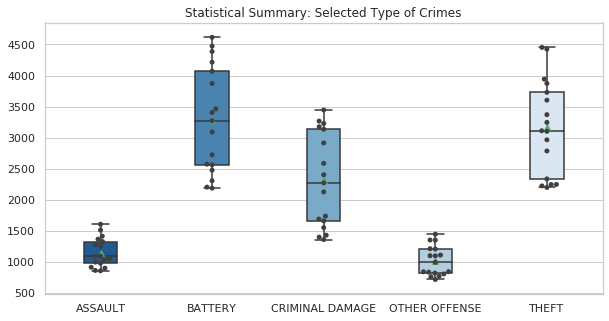

In [45]:
plt.figure(figsize=(10,5))
sns.set_style("whitegrid")
sns.color_palette("GnBu_d")
sns.boxplot(data=Type_Crime_Y2, palette="Blues_r", width=0.3, showmeans = True )
ax = sns.swarmplot(data=Type_Crime_Y2, color=".25")
plt.title("Statistical Summary: Selected Type of Crimes")


Text(0.5, 1.0, 'Ranking type of crimes - year 2020')

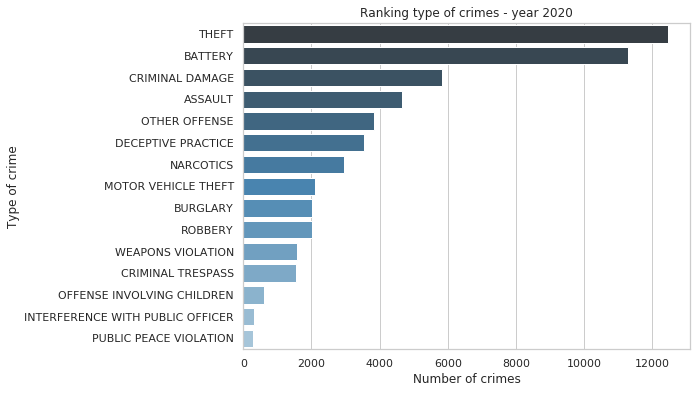

In [46]:
import seaborn as sns
import matplotlib.pyplot as plt

plt.figure(figsize = (8, 6))
sns.countplot(y= 'Primary_Type',data = ext_chicago_crime_2020, order = ext_chicago_crime_2020['Primary_Type'].value_counts().iloc[:15].index, palette="Blues_d")
sns.set(style="darkgrid")
plt.xlabel("Number of crimes")
plt.ylabel("Type of crime")
plt.title ("Ranking type of crimes - year 2020")

#### Visualize the hotspots for crimes in Chicago

In [47]:
ext_chicago_crime_2020.head()

,ID,Case Number,Date,Block,Primary_Type,Description,Location Description,Arrest,Domestic,Beat,...,Ward_x,Community Area,Year,Latitude,Longitude,Location,ZIP Code,Neighborhood,Ward_y,Police District
3361301,24889,JD101272,01/02/2020 02:54:00 AM,072XX S SOUTH SHORE DR,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,False,334,...,7.0,43.0,2020,41.764728,-87.561272,"(41.764728045, -87.561272312)",60619,SOUTH SHORE,5,3
3362681,24890,JD101272,01/02/2020 03:17:00 AM,072XX S SOUTH SHORE DR,HOMICIDE,FIRST DEGREE MURDER,APARTMENT,True,False,334,...,7.0,43.0,2020,41.764728,-87.561272,"(41.764728045, -87.561272312)",60619,SOUTH SHORE,5,3
3364201,24891,JD101694,01/02/2020 02:19:00 PM,069XX S MICHIGAN AVE,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,322,...,6.0,69.0,2020,41.768261,-87.621765,"(41.768260855, -87.621765291)",60637,GREATER GRAND CROSSING,20,3
3360061,24892,JD102066,01/02/2020 07:02:00 PM,082XX S DREXEL AVE,HOMICIDE,FIRST DEGREE MURDER,STREET,False,False,631,...,8.0,44.0,2020,41.745259,-87.602587,"(41.745258504, -87.602587071)",60619,CHATHAM,6,6
3358697,24893,JD103496,01/03/2020 08:57:00 PM,060XX S RACINE AVE,HOMICIDE,FIRST DEGREE MURDER,RETAIL STORE,True,False,712,...,16.0,68.0,2020,41.784088,-87.654615,"(41.78408837, -87.654615414)",60621,ENGLEWOOD,17,7


In [48]:
print("Longitude:",ext_chicago_crime_2020['Longitude'].nunique())
print("Latitude:",ext_chicago_crime_2020['Latitude'].nunique())
print("Location:",ext_chicago_crime_2020['Location'].nunique())

Longitude: 38276
Latitude: 38274
Location: 38279


In [49]:
consol_location = ext_chicago_crime_2020.groupby(['Location']).count()[['ID']]
consol_location.shape

(38279, 1)

In [50]:
# merge the 2 tables
consol_location = pd.merge(consol_location,ext_chicago_crime_2020, on = 'Location', how ='left')
consol_location.shape

(56176, 22)

In [51]:
# After merging, I have created some duplicate rows, that needs to be removed
# Remove added columns with no values
consol_location.sort_values("Location", inplace = True) 

# dropping ALL duplicte values 
consol_location.drop_duplicates(subset = ['Location'],keep = 'first', inplace = True) 
consol_location.shape

(38279, 22)

In [52]:
consol_location.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 38279 entries, 0 to 56175
Data columns (total 22 columns):
 #   Column                Non-Null Count  Dtype   
---  ------                --------------  -----   
 0   Location              38279 non-null  object  
 1   ID_x                  38279 non-null  int64   
 2   ID_y                  38279 non-null  int64   
 3   Case Number           38279 non-null  object  
 4   Date                  38279 non-null  object  
 5   Block                 38279 non-null  object  
 6   Primary_Type          38279 non-null  category
 7   Description           38279 non-null  category
 8   Location Description  38114 non-null  category
 9   Arrest                38279 non-null  category
 10  Domestic              38279 non-null  category
 11  Beat                  38279 non-null  int64   
 12  District              38279 non-null  int64   
 13  Ward_x                38278 non-null  float64 
 14  Community Area        38279 non-null  float64 
 15  Ye

In [53]:
columns = ['ID_y', 'Case Number', 'Date', 'Primary_Type', 'Description', 'Location Description', 'Arrest', 'Domestic']
consol_location.drop(columns, axis = 1, inplace = True)

In [54]:
consol_location.sort_values("ID_x", ascending = False, inplace = True)
consol_location.head(25)

,Location,ID_x,Block,Beat,District,Ward_x,Community Area,Year,Latitude,Longitude,ZIP Code,Neighborhood,Ward_y,Police District
35597,"(41.883500187, -87.627876698)",112,001XX N STATE ST,111,1,42.0,32.0,2020,41.883500,-87.627877,60605,LOOP,2,1
10672,"(41.754592961, -87.741528537)",67,076XX S CICERO AVE,833,8,18.0,65.0,2020,41.754593,-87.741529,60629,WEST LAWN,13,8
52977,"(41.976290414, -87.905227221)",63,100XX W OHARE ST,1651,16,41.0,76.0,2020,41.976290,-87.905227,60656,OHARE,41,16
7234,"(41.742710224, -87.634088181)",53,083XX S STEWART AVE,622,6,21.0,44.0,2020,41.742710,-87.634088,60619,CHATHAM,6,6
30148,"(41.868541914, -87.639235361)",51,011XX S CANAL ST,124,1,25.0,28.0,2020,41.868542,-87.639235,60608,NEAR WEST SIDE,2,12
34584,"(41.88171846, -87.627760426)",50,0000X S STATE ST,112,1,42.0,32.0,2020,41.881718,-87.627760,60605,LOOP,2,1
36104,"(41.884650262, -87.627915459)",45,001XX N STATE ST,111,1,42.0,32.0,2020,41.884650,-87.627915,60605,LOOP,2,1
51359,"(41.963070794, -87.655984213)",41,044XX N BROADWAY,1913,19,46.0,3.0,2020,41.963071,-87.655984,60640,UPTOWN,46,19
40500,"(41.897895128, -87.624096605)",40,008XX N MICHIGAN AVE,1833,18,2.0,8.0,2020,41.897895,-87.624097,60610,NEAR NORTH SIDE,43,18
9434,"(41.750940757, -87.625185222)",39,0000X W 79TH ST,623,6,6.0,44.0,2020,41.750941,-87.625185,60620,CHATHAM,21,6


In [56]:
consol_location.shape

(38279, 14)

In [55]:
!pip install folium

import folium

print('Folium installed and imported!')

Folium installed and imported!


In [56]:
limit = 10000
consol_location = consol_location.iloc[0:limit, :]


from folium import plugins
lat_start = consol_location['Latitude'].mean()
lng_start = consol_location['Longitude'].mean()


# let's start again with a clean copy of the map of Chicago
chicago_crime_map = folium.Map(location=[lat_start, lng_start],
                        zoom_start=13,
                        tiles="cartodbpositron")

# instantiate a mark cluster object for the incidents in the dataframe
crimes = plugins.MarkerCluster().add_to(chicago_crime_map)

# loop through the dataframe and add each data point to the mark cluster
for lat, lng, label, in zip(consol_location.Latitude, consol_location.Longitude, consol_location.Block):
    folium.Marker(
        location=[lat, lng],
        icon=None,
        popup=label,
    ).add_to(crimes)

                               
# add incidents to map
chicago_crime_map.add_child(crimes)

# Criteria # 2: Public schools in Chicago

####  The goal of this section is to provide transparency to the users with for their choice. As parents pursue to offer their children not only a save environment but also a good education. Based on the data from the Chicago progress report and using k-means, the schools will be clustered (partitioned) into groups of institutions that have similar characteristics.At the end I will select the cluster with the top-rated public schools and exclude the areas with high criminality as shown in the previous section.

#### 2.a) Data source and preparation

####  the data 

In [57]:
# Let's tage a look at the dataset
public_schools_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 79 columns):
 #   Column                                             Non-Null Count  Dtype  
---  ------                                             --------------  -----  
 0   School ID                                          566 non-null    int64  
 1   Name of School                                     566 non-null    object 
 2   Elementary, Middle, or High School                 566 non-null    object 
 3   Street Address                                     566 non-null    object 
 4   City                                               566 non-null    object 
 5   State                                              566 non-null    object 
 6   ZIP Code                                           566 non-null    int64  
 7   Phone Number                                       566 non-null    object 
 8   Link                                               565 non-null    object 
 9   Network Ma

In [58]:
# very a number of columns and information not needed, therefore we removed them
public_schools_df = public_schools_df.iloc[:,[0,1,6,14,17,19,21,23,25,27,29,31,32,33,72,73,74,75,78]]
public_schools_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 19 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   School ID                                566 non-null    int64  
 1   Name of School                           566 non-null    object 
 2   ZIP Code                                 566 non-null    int64  
 3   CPS Performance Policy Level             566 non-null    object 
 4   Safety Score                             513 non-null    float64
 5   Family Involvement Score                 566 non-null    object 
 6   Environment Score                        513 non-null    float64
 7   Instruction Score                        513 non-null    float64
 8   Leaders Score                            566 non-null    object 
 9   Teachers Score                           566 non-null    object 
 10  Parent Engagement Score                  566 non-n

In [59]:
public_schools_df.head()

,School ID,Name of School,ZIP Code,CPS Performance Policy Level,Safety Score,Family Involvement Score,Environment Score,Instruction Score,Leaders Score,Teachers Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location
0,609966,Charles G Hammond Elementary School,60623,Level 2,40.0,NDA,41.0,43.0,NDA,NDA,43,45,95.3,8.5,41.852691,-87.696278,30,SOUTH LAWNDALE,"(41.85269133, -87.69627777)"
1,610539,Marvin Camras Elementary School,60634,Not Enough Data,54.0,58,37.0,41.0,83,88,51,55,95.1,4.3,41.934966,-87.770165,19,BELMONT CRAGIN,"(41.93496641, -87.77016525)"
2,609852,Eliza Chappell Elementary School,60625,Level 1,70.0,65,53.0,51.0,56,48,50,52,95.1,2.9,41.975867,-87.683254,4,LINCOLN SQUARE,"(41.975867, -87.68325438)"
3,609835,Daniel R Cameron Elementary School,60651,Level 3,42.0,NDA,49.0,50.0,NDA,NDA,46,46,92.6,153.9,41.903785,-87.717963,23,HUMBOLDT PARK,"(41.90378521, -87.71796315)"
4,610521,Sir Miles Davis Magnet Elementary Academy,60636,Level 3,35.0,NDA,51.0,54.0,NDA,NDA,NDA,NDA,93.0,57.8,41.771222,-87.666567,67,WEST ENGLEWOOD,"(41.77122181, -87.66656657)"


#### The target of this section is to cluster the schools (partition) into groups of institutions that have similar characteristics using the k-means algorithm isn't directly applicable to categorical variables because Euclidean distance function is not meaningful for discrete variables. Hence unnecessary columns should be removed and the datatype needs to the transformed into int.

In [60]:
public_schools_df.columns = ['School ID','Name of School','ZIP Code','CPS Performance Policy Level','Safety Score','Family Involvement Score','Environment Score','Instruction Score','Leaders Score','Teachers Score','Parent Engagement Score','Parent Environment Score','Average Student Attendance','Rate of Misconducts (per 100 students)','Latitude','Longitude','Community Area','Neighborhood','Location']
public_schools_df.head()

,School ID,Name of School,ZIP Code,CPS Performance Policy Level,Safety Score,Family Involvement Score,Environment Score,Instruction Score,Leaders Score,Teachers Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location
0,609966,Charles G Hammond Elementary School,60623,Level 2,40.0,NDA,41.0,43.0,NDA,NDA,43,45,95.3,8.5,41.852691,-87.696278,30,SOUTH LAWNDALE,"(41.85269133, -87.69627777)"
1,610539,Marvin Camras Elementary School,60634,Not Enough Data,54.0,58,37.0,41.0,83,88,51,55,95.1,4.3,41.934966,-87.770165,19,BELMONT CRAGIN,"(41.93496641, -87.77016525)"
2,609852,Eliza Chappell Elementary School,60625,Level 1,70.0,65,53.0,51.0,56,48,50,52,95.1,2.9,41.975867,-87.683254,4,LINCOLN SQUARE,"(41.975867, -87.68325438)"
3,609835,Daniel R Cameron Elementary School,60651,Level 3,42.0,NDA,49.0,50.0,NDA,NDA,46,46,92.6,153.9,41.903785,-87.717963,23,HUMBOLDT PARK,"(41.90378521, -87.71796315)"
4,610521,Sir Miles Davis Magnet Elementary Academy,60636,Level 3,35.0,NDA,51.0,54.0,NDA,NDA,NDA,NDA,93.0,57.8,41.771222,-87.666567,67,WEST ENGLEWOOD,"(41.77122181, -87.66656657)"


In [61]:
column = ['Family Involvement Score','Instruction Score','Leaders Score','Teachers Score','Parent Engagement Score', 'Parent Environment Score']
#public_schools_df.loc[public_schools_df[column] == 'NDA', column] = public_schools_df[null]
public_schools_df[column].fillna(0,inplace = True)
public_schools_df.head()


/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/pandas/core/frame.py:4153: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  downcast=downcast,


,School ID,Name of School,ZIP Code,CPS Performance Policy Level,Safety Score,Family Involvement Score,Environment Score,Instruction Score,Leaders Score,Teachers Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location
0,609966,Charles G Hammond Elementary School,60623,Level 2,40.0,NDA,41.0,43.0,NDA,NDA,43,45,95.3,8.5,41.852691,-87.696278,30,SOUTH LAWNDALE,"(41.85269133, -87.69627777)"
1,610539,Marvin Camras Elementary School,60634,Not Enough Data,54.0,58,37.0,41.0,83,88,51,55,95.1,4.3,41.934966,-87.770165,19,BELMONT CRAGIN,"(41.93496641, -87.77016525)"
2,609852,Eliza Chappell Elementary School,60625,Level 1,70.0,65,53.0,51.0,56,48,50,52,95.1,2.9,41.975867,-87.683254,4,LINCOLN SQUARE,"(41.975867, -87.68325438)"
3,609835,Daniel R Cameron Elementary School,60651,Level 3,42.0,NDA,49.0,50.0,NDA,NDA,46,46,92.6,153.9,41.903785,-87.717963,23,HUMBOLDT PARK,"(41.90378521, -87.71796315)"
4,610521,Sir Miles Davis Magnet Elementary Academy,60636,Level 3,35.0,NDA,51.0,54.0,NDA,NDA,NDA,NDA,93.0,57.8,41.771222,-87.666567,67,WEST ENGLEWOOD,"(41.77122181, -87.66656657)"


In [62]:
for cluster_column in ['Family Involvement Score','Leaders Score', 'Instruction Score', 'Teachers Score','Parent Engagement Score', 'Parent Environment Score']:
    public_schools_df[cluster_column] = pd.to_numeric(public_schools_df[cluster_column], errors='coerce')
   # public_schools_df[cluster_column] =  public_schools_df[cluster_column].astype('float64')

In [63]:
public_schools_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 566 entries, 0 to 565
Data columns (total 19 columns):
 #   Column                                  Non-Null Count  Dtype  
---  ------                                  --------------  -----  
 0   School ID                               566 non-null    int64  
 1   Name of School                          566 non-null    object 
 2   ZIP Code                                566 non-null    int64  
 3   CPS Performance Policy Level            566 non-null    object 
 4   Safety Score                            513 non-null    float64
 5   Family Involvement Score                297 non-null    float64
 6   Environment Score                       513 non-null    float64
 7   Instruction Score                       513 non-null    float64
 8   Leaders Score                           295 non-null    float64
 9   Teachers Score                          295 non-null    float64
 10  Parent Engagement Score                 432 non-null    float6

In [64]:
public_schools_df.head()

,School ID,Name of School,ZIP Code,CPS Performance Policy Level,Safety Score,Family Involvement Score,Environment Score,Instruction Score,Leaders Score,Teachers Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location
0,609966,Charles G Hammond Elementary School,60623,Level 2,40.0,NaN,41.0,43.0,NaN,NaN,43.0,45.0,95.3,8.5,41.852691,-87.696278,30,SOUTH LAWNDALE,"(41.85269133, -87.69627777)"
1,610539,Marvin Camras Elementary School,60634,Not Enough Data,54.0,58.0,37.0,41.0,83.0,88.0,51.0,55.0,95.1,4.3,41.934966,-87.770165,19,BELMONT CRAGIN,"(41.93496641, -87.77016525)"
2,609852,Eliza Chappell Elementary School,60625,Level 1,70.0,65.0,53.0,51.0,56.0,48.0,50.0,52.0,95.1,2.9,41.975867,-87.683254,4,LINCOLN SQUARE,"(41.975867, -87.68325438)"
3,609835,Daniel R Cameron Elementary School,60651,Level 3,42.0,NaN,49.0,50.0,NaN,NaN,46.0,46.0,92.6,153.9,41.903785,-87.717963,23,HUMBOLDT PARK,"(41.90378521, -87.71796315)"
4,610521,Sir Miles Davis Magnet Elementary Academy,60636,Level 3,35.0,NaN,51.0,54.0,NaN,NaN,NaN,NaN,93.0,57.8,41.771222,-87.666567,67,WEST ENGLEWOOD,"(41.77122181, -87.66656657)"


In [65]:
public_schools_df[column] = public_schools_df[column].fillna(0)
public_schools_df.head()
#public_schools_df[column] = public_schools_df[column].replace("NDA", 0, inplace = True)

,School ID,Name of School,ZIP Code,CPS Performance Policy Level,Safety Score,Family Involvement Score,Environment Score,Instruction Score,Leaders Score,Teachers Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location
0,609966,Charles G Hammond Elementary School,60623,Level 2,40.0,0.0,41.0,43.0,0.0,0.0,43.0,45.0,95.3,8.5,41.852691,-87.696278,30,SOUTH LAWNDALE,"(41.85269133, -87.69627777)"
1,610539,Marvin Camras Elementary School,60634,Not Enough Data,54.0,58.0,37.0,41.0,83.0,88.0,51.0,55.0,95.1,4.3,41.934966,-87.770165,19,BELMONT CRAGIN,"(41.93496641, -87.77016525)"
2,609852,Eliza Chappell Elementary School,60625,Level 1,70.0,65.0,53.0,51.0,56.0,48.0,50.0,52.0,95.1,2.9,41.975867,-87.683254,4,LINCOLN SQUARE,"(41.975867, -87.68325438)"
3,609835,Daniel R Cameron Elementary School,60651,Level 3,42.0,0.0,49.0,50.0,0.0,0.0,46.0,46.0,92.6,153.9,41.903785,-87.717963,23,HUMBOLDT PARK,"(41.90378521, -87.71796315)"
4,610521,Sir Miles Davis Magnet Elementary Academy,60636,Level 3,35.0,0.0,51.0,54.0,0.0,0.0,0.0,0.0,93.0,57.8,41.771222,-87.666567,67,WEST ENGLEWOOD,"(41.77122181, -87.66656657)"


In [66]:
public_schools_df.drop(['Family Involvement Score', 'Leaders Score', 'Teachers Score'], axis = 1, inplace = True)
public_schools_df.head()

,School ID,Name of School,ZIP Code,CPS Performance Policy Level,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location
0,609966,Charles G Hammond Elementary School,60623,Level 2,40.0,41.0,43.0,43.0,45.0,95.3,8.5,41.852691,-87.696278,30,SOUTH LAWNDALE,"(41.85269133, -87.69627777)"
1,610539,Marvin Camras Elementary School,60634,Not Enough Data,54.0,37.0,41.0,51.0,55.0,95.1,4.3,41.934966,-87.770165,19,BELMONT CRAGIN,"(41.93496641, -87.77016525)"
2,609852,Eliza Chappell Elementary School,60625,Level 1,70.0,53.0,51.0,50.0,52.0,95.1,2.9,41.975867,-87.683254,4,LINCOLN SQUARE,"(41.975867, -87.68325438)"
3,609835,Daniel R Cameron Elementary School,60651,Level 3,42.0,49.0,50.0,46.0,46.0,92.6,153.9,41.903785,-87.717963,23,HUMBOLDT PARK,"(41.90378521, -87.71796315)"
4,610521,Sir Miles Davis Magnet Elementary Academy,60636,Level 3,35.0,51.0,54.0,0.0,0.0,93.0,57.8,41.771222,-87.666567,67,WEST ENGLEWOOD,"(41.77122181, -87.66656657)"


In [67]:
cols = ['Safety Score', 'Environment Score','Instruction Score', 'Average Student Attendance']
public_schools_df.dropna(axis=0, subset=cols, inplace = True)
public_schools_df.shape

(513, 16)

### Let's start the clustering from chicago public Schools

In [68]:
from sklearn.preprocessing import StandardScaler

X = public_schools_df.values[:,4:10]
X = np.nan_to_num(X)
cluster_dataset = StandardScaler().fit_transform(X)
cluster_dataset

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/sklearn/utils/validation.py:595: DataConversionWarning: Data with input dtype object was converted to float64 by StandardScaler.
  warnings.warn(msg, DataConversionWarning)


array([[-0.47308577, -0.41766525, -0.30393338,  0.22395153,  0.31807508,
         0.50173498],
       [ 0.2237358 , -0.66458231, -0.41887464,  0.59232712,  0.77966637,
         0.46573889],
       [ 1.02010331,  0.32308591,  0.15583167,  0.54628017,  0.64118898,
         0.46573889],
       ...,
       [-0.47308577,  0.01443959, -0.30393338,  0.31604543,  0.45655247,
         0.53773107],
       [ 0.42282768,  1.12556635,  0.96042051,  0.59232712,  0.45655247,
        -0.05620442],
       [-0.52285874, -1.03495789, -1.10852221, -1.75606724, -1.75908569,
         0.39374671]])

#### Modeling: Let's run our model and group the schools into four clusters.

In [69]:
from sklearn.cluster import KMeans 

num_clusters = 7

k_means = KMeans(init="k-means++", n_clusters=num_clusters, n_init=12)
k_means.fit(cluster_dataset)
labels = k_means.labels_

print(labels)

[2 2 2 5 4 0 3 1 4 5 0 3 3 2 6 3 2 2 2 1 5 0 3 0 3 1 4 4 2 0 4 5 1 2 3 6 1
 2 4 0 0 1 3 5 2 6 3 5 2 0 1 2 0 0 4 2 2 5 4 5 2 0 5 1 1 6 3 0 4 5 1 1 2 0
 0 2 6 6 1 3 2 4 5 5 5 5 2 1 4 5 3 0 0 5 0 0 0 4 2 1 2 3 6 0 3 5 3 0 1 3 0
 5 1 4 2 6 3 3 3 0 0 6 1 5 5 2 5 4 0 6 0 6 5 2 5 2 6 5 0 1 3 0 1 5 3 2 2 4
 2 5 5 2 2 0 5 0 2 5 1 0 5 5 5 3 0 2 0 5 2 5 3 2 4 5 5 5 2 2 6 0 2 4 0 6 0
 3 5 3 3 0 6 0 2 2 3 3 5 2 4 5 0 1 4 0 2 2 4 4 4 3 0 2 0 2 1 5 0 5 1 2 3 2
 5 4 5 1 2 2 6 6 2 4 3 5 6 5 5 4 2 3 3 0 1 0 6 3 5 5 0 0 0 3 6 0 3 2 3 3 5
 2 1 4 3 1 0 3 2 3 1 4 0 4 1 5 4 5 2 5 3 3 5 2 1 0 4 5 2 5 4 0 6 0 1 3 2 1
 3 0 3 3 2 4 3 5 2 2 3 4 0 3 2 2 5 2 4 0 3 6 0 2 5 3 3 4 2 0 2 2 4 0 5 0 5
 5 3 5 4 2 2 3 1 2 2 0 3 5 2 3 4 1 0 4 4 5 3 0 5 6 5 2 2 5 2 6 5 5 5 4 0 5
 2 0 3 5 2 2 2 2 3 1 5 0 5 0 2 0 0 5 2 2 0 0 3 0 5 5 4 2 2 2 6 5 5 6 2 1 2
 3 3 6 2 0 0 0 3 5 3 4 5 2 2 5 2 0 3 2 3 5 2 1 0 2 4 2 0 3 1 0 2 4 5 1 2 2
 3 1 3 1 2 2 2 4 0 4 0 0 3 2 5 3 4 2 5 3 3 3 0 5 2 2 4 6 3 4 0 5 2 0 5 2 0
 3 5 1 0 5 2 0 5 3 1 2 3 

In [70]:
public_schools_df["Labels"] = labels
public_schools_df.head(5)

,School ID,Name of School,ZIP Code,CPS Performance Policy Level,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels
0,609966,Charles G Hammond Elementary School,60623,Level 2,40.0,41.0,43.0,43.0,45.0,95.3,8.5,41.852691,-87.696278,30,SOUTH LAWNDALE,"(41.85269133, -87.69627777)",2
1,610539,Marvin Camras Elementary School,60634,Not Enough Data,54.0,37.0,41.0,51.0,55.0,95.1,4.3,41.934966,-87.770165,19,BELMONT CRAGIN,"(41.93496641, -87.77016525)",2
2,609852,Eliza Chappell Elementary School,60625,Level 1,70.0,53.0,51.0,50.0,52.0,95.1,2.9,41.975867,-87.683254,4,LINCOLN SQUARE,"(41.975867, -87.68325438)",2
3,609835,Daniel R Cameron Elementary School,60651,Level 3,42.0,49.0,50.0,46.0,46.0,92.6,153.9,41.903785,-87.717963,23,HUMBOLDT PARK,"(41.90378521, -87.71796315)",5
4,610521,Sir Miles Davis Magnet Elementary Academy,60636,Level 3,35.0,51.0,54.0,0.0,0.0,93.0,57.8,41.771222,-87.666567,67,WEST ENGLEWOOD,"(41.77122181, -87.66656657)",4


In [71]:
public_schools_df.groupby('Labels').mean()

,School ID,ZIP Code,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area
Labels,,,,,,,,,,,,
0,610023.359551,60634.123596,31.191011,31.056180,30.988764,47.370787,48.629213,91.913483,38.746067,41.811839,-87.665179,44.303371
1,610012.727273,60627.204545,40.454545,33.977273,33.363636,0.000000,0.000000,91.343182,21.772727,41.815941,-87.671853,44.500000
2,610085.050420,60629.630252,57.361345,44.899160,41.974790,49.949580,49.882353,94.706723,13.974790,41.866129,-87.689208,34.420168
3,610086.567901,60630.358025,76.901235,70.222222,68.666667,54.246914,51.444444,95.444444,7.217284,41.881361,-87.693851,28.580247
4,610023.634615,60628.192308,58.596154,57.096154,57.576923,0.000000,0.000000,93.765385,15.871154,41.866938,-87.673312,30.730769
5,610078.606061,60627.353535,37.313131,52.373737,59.585859,49.222222,50.323232,93.280808,31.092929,41.808105,-87.668311,44.707071
6,602572.172414,60629.034483,36.000000,36.551724,37.793103,4.724138,4.724138,74.058621,26.017241,41.829507,-87.667455,41.000000


In [72]:
public_schools_df.mean()

School ID                                 609636.210526
ZIP Code                                   60629.697856
Safety Score                                  49.504873
Environment Score                             47.766082
Instruction Score                             48.288499
Parent Engagement Score                       38.136452
Parent Environment Score                      38.109162
Average Student Attendance                    92.512281
Rate of Misconducts (per 100 students)        22.050682
Latitude                                      41.841625
Longitude                                    -87.677410
Community Area                                38.060429
Labels                                         2.732943
dtype: float64

In [73]:
df2 = public_schools_df.groupby('Labels').mean()
df2['Safety Classification'] = np.where(df2['Safety Score'] > public_schools_df['Safety Score'].mean(), 'better than average', 'below average')
df2['Environment Classification'] = np.where(df2['Environment Score'] > public_schools_df['Environment Score'].mean(), 'better than average', 'below average')
df2['Instruction Classification'] = np.where(df2['Instruction Score'] > public_schools_df['Instruction Score'].mean(), 'better than average', 'below average')
df2['Parent Engagement Classification'] = np.where(df2['Parent Engagement Score'] > public_schools_df['Parent Engagement Score'].mean(), 'better than average', 'below average')
df2['Parent Environmental Classification'] = np.where(df2['Parent Environment Score'] > public_schools_df['Parent Environment Score'].mean(), 'better than average', 'below average')
df2['Average Student Attendance Classification'] = np.where(df2['Average Student Attendance'] > public_schools_df['Average Student Attendance'].mean(), 'better than average', 'below average')
df2['Rate of Misconducts Classification'] = np.where(df2['Rate of Misconducts (per 100 students)'] > public_schools_df['Rate of Misconducts (per 100 students)'].mean(), 'worse than average', 'better than average')
df2.head(7)

,School ID,ZIP Code,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Safety Classification,Environment Classification,Instruction Classification,Parent Engagement Classification,Parent Environmental Classification,Average Student Attendance Classification,Rate of Misconducts Classification
Labels,,,,,,,,,,,,,,,,,,,
0,610023.359551,60634.123596,31.191011,31.056180,30.988764,47.370787,48.629213,91.913483,38.746067,41.811839,-87.665179,44.303371,below average,below average,below average,better than average,better than average,below average,worse than average
1,610012.727273,60627.204545,40.454545,33.977273,33.363636,0.000000,0.000000,91.343182,21.772727,41.815941,-87.671853,44.500000,below average,below average,below average,below average,below average,below average,better than average
2,610085.050420,60629.630252,57.361345,44.899160,41.974790,49.949580,49.882353,94.706723,13.974790,41.866129,-87.689208,34.420168,better than average,below average,below average,better than average,better than average,better than average,better than average
3,610086.567901,60630.358025,76.901235,70.222222,68.666667,54.246914,51.444444,95.444444,7.217284,41.881361,-87.693851,28.580247,better than average,better than average,better than average,better than average,better than average,better than average,better than average
4,610023.634615,60628.192308,58.596154,57.096154,57.576923,0.000000,0.000000,93.765385,15.871154,41.866938,-87.673312,30.730769,better than average,better than average,better than average,below average,below average,better than average,better than average
5,610078.606061,60627.353535,37.313131,52.373737,59.585859,49.222222,50.323232,93.280808,31.092929,41.808105,-87.668311,44.707071,below average,better than average,better than average,better than average,better than average,better than average,worse than average
6,602572.172414,60629.034483,36.000000,36.551724,37.793103,4.724138,4.724138,74.058621,26.017241,41.829507,-87.667455,41.000000,below average,below average,below average,below average,below average,below average,worse than average


In [74]:
df3 = df2.iloc[:,[12, 13,14, 15,16,17,18]]
df3.head(7)

,Safety Classification,Environment Classification,Instruction Classification,Parent Engagement Classification,Parent Environmental Classification,Average Student Attendance Classification,Rate of Misconducts Classification
Labels,,,,,,,
0,below average,below average,below average,better than average,better than average,below average,worse than average
1,below average,below average,below average,below average,below average,below average,better than average
2,better than average,below average,below average,better than average,better than average,better than average,better than average
3,better than average,better than average,better than average,better than average,better than average,better than average,better than average
4,better than average,better than average,better than average,below average,below average,better than average,better than average
5,below average,better than average,better than average,better than average,better than average,better than average,worse than average
6,below average,below average,below average,below average,below average,below average,worse than average


In [75]:
filter_df = public_schools_df.iloc[:,4:13]
filter_df.describe()

,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude
count,513.000000,513.000000,513.000000,513.000000,513.000000,513.000000,513.000000,513.000000,513.000000
mean,49.504873,47.766082,48.288499,38.136452,38.109162,92.512281,22.050682,41.841625,-87.677410
std,20.110837,16.215584,17.417176,21.738163,21.685333,5.561582,28.264920,0.090634,0.058347
min,1.000000,1.000000,1.000000,0.000000,0.000000,57.900000,0.000000,41.653674,-87.841052
25%,35.000000,37.000000,37.000000,41.000000,41.000000,91.900000,5.300000,41.771222,-87.717266
50%,48.000000,47.000000,47.000000,48.000000,48.000000,94.400000,12.800000,41.847969,-87.675773
75%,61.000000,58.000000,59.000000,52.000000,52.000000,95.500000,28.100000,41.913882,-87.637601
max,99.000000,99.000000,99.000000,69.000000,70.000000,98.400000,251.600000,42.021064,-87.533007


Text(0.5, 1.0, 'Statistic for School metrics')

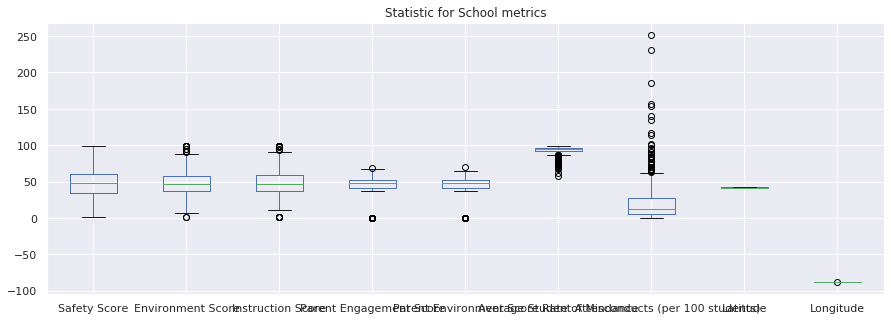

In [76]:
filter_df.plot(kind = 'box', figsize = (15,5))
plt.title("Statistic for School metrics")

## Examine Clusters

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:20: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.


Text(0.5, 1.0, 'Ranking by Misconduct')

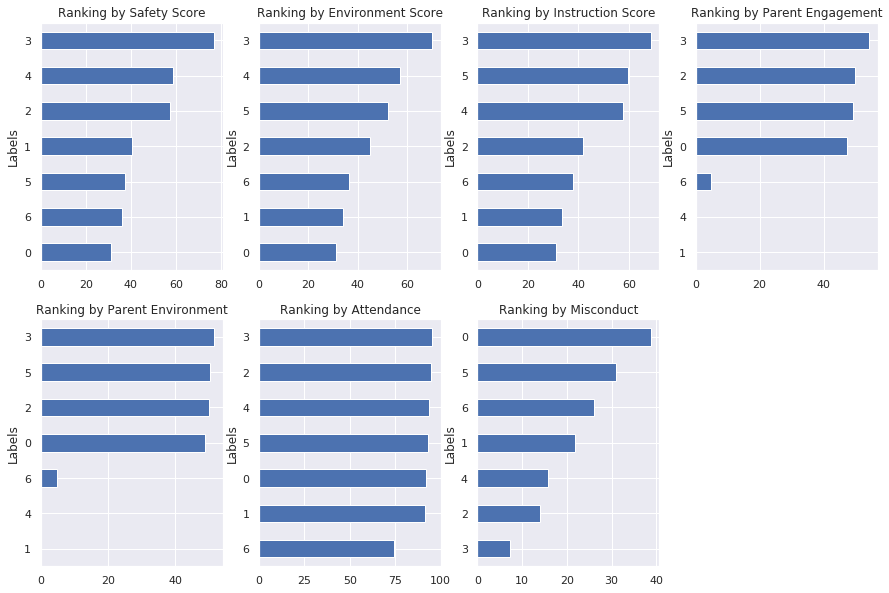

In [77]:
df_Safety = df2.iloc[:,2].sort_values(ascending = True)
df_Environment = df2.iloc[:,3].sort_values(ascending = True)
df_Instruction = df2.iloc[:,4].sort_values(ascending = True)
df_Parent_Eng = df2.iloc[:,5].sort_values(ascending = True)
df_Parent_Env = df2.iloc[:,6].sort_values(ascending = True)
df_Attendance = df2.iloc[:,7].sort_values(ascending = True)
df_Misconduct = df2.iloc[:,8].sort_values(ascending = True)


fig = plt.figure()
ax = fig.add_subplot(2,4,7)

ax0 = fig.add_subplot(2, 4, 1) # first plot)
ax1 = fig.add_subplot(2, 4, 2) # second plot
ax2 = fig.add_subplot(2, 4, 3) # third plot
ax3 = fig.add_subplot(2, 4, 4) # 4th plot

ax4 = fig.add_subplot(2, 4, 5) # 5th plot
ax5 = fig.add_subplot(2, 4, 6) # 6th plot
ax6 = fig.add_subplot(2, 4, 7) # 7th plot


ax0 = df_Safety.plot(kind = 'barh', figsize=(15,10), ax = ax0)
ax0.set_title ('Ranking by Safety Score')
ax1 = df_Environment.plot(kind = 'barh',figsize=(15,10), ax = ax1)
ax1.set_title ('Ranking by Environment Score')
ax2 = df_Instruction.plot(kind = 'barh',figsize=(15,10), ax = ax2)
ax2.set_title ('Ranking by Instruction Score')
ax3 = df_Parent_Eng.plot(kind = 'barh',figsize=(15,10), ax = ax3)
ax3.set_title ('Ranking by Parent Engagement')
ax4 = df_Parent_Env.plot(kind = 'barh',figsize=(15,10), ax = ax4)
ax4.set_title ('Ranking by Parent Environment')
ax5 = df_Attendance.plot(kind = 'barh',figsize=(15,10), ax = ax5)
ax5.set_title ('Ranking by Attendance')
ax5 = df_Misconduct.plot(kind = 'barh',figsize=(15,10), ax = ax6)
ax5.set_title ('Ranking by Misconduct')

### Cluster 0

In [78]:
df3.iloc[0,:]

Safety Classification                              below average
Environment Classification                         below average
Instruction Classification                         below average
Parent Engagement Classification             better than average
Parent Environmental Classification          better than average
Average Student Attendance Classification          below average
Rate of Misconducts Classification            worse than average
Name: 0, dtype: object

In [79]:
public_schools_df.loc[public_schools_df['Labels'] == 0, public_schools_df.columns[[1] + list(range(4, public_schools_df.shape[1]))]]

,Name of School,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels
5,Luther Burbank Elementary School,37.0,42.0,34.0,47.0,49.0,95.2,9.8,41.917593,-87.782663,19,BELMONT CRAGIN,"(41.91759334, -87.78266267)",0
10,Ira F Aldridge Elementary School,39.0,36.0,39.0,49.0,46.0,92.9,49.0,41.657432,-87.606496,54,RIVERDALE,"(41.65743243, -87.60649623)",0
23,Joseph E Gary Elementary School,32.0,29.0,28.0,45.0,48.0,96.1,16.8,41.837092,-87.718705,30,SOUTH LAWNDALE,"(41.83709246, -87.71870452)",0
25,Richard J Daley Elementary Academy,29.0,37.0,46.0,46.0,47.0,94.9,44.2,41.802344,-87.672243,61,NEW CITY,"(41.80234381, -87.67224309)",0
32,Granville T Woods Math & Science Academy Eleme...,35.0,43.0,31.0,48.0,49.0,91.9,41.5,41.781165,-87.654688,67,WEST ENGLEWOOD,"(41.7811649, -87.65468845)",0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524,John H Hamline Elementary School,33.0,29.0,43.0,44.0,47.0,94.4,7.5,41.807263,-87.661139,61,NEW CITY,"(41.80726347, -87.66113856)",0
527,Roger C Sullivan High School,30.0,34.0,34.0,44.0,45.0,81.6,14.7,42.002687,-87.669155,1,ROGERS PARK,"(42.00268694, -87.66915533)",0
530,West Park Elementary Academy,29.0,36.0,40.0,46.0,47.0,93.7,16.3,41.906910,-87.732406,23,HUMBOLDT PARK,"(41.90691024, -87.73240646)",0
534,Alfred David Kohn Elementary School,19.0,22.0,13.0,47.0,45.0,90.1,31.2,41.704851,-87.623602,49,ROSELAND,"(41.70485072, -87.62360199)",0


### Cluster 1

In [80]:
df3.iloc[1,:]

Safety Classification                              below average
Environment Classification                         below average
Instruction Classification                         below average
Parent Engagement Classification                   below average
Parent Environmental Classification                below average
Average Student Attendance Classification          below average
Rate of Misconducts Classification           better than average
Name: 1, dtype: object

In [81]:
public_schools_df.loc[public_schools_df['Labels'] == 1, public_schools_df.columns[[1] + list(range(4, public_schools_df.shape[1]))]]

,Name of School,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels
7,James N Thorp Elementary School,32.0,39.0,39.0,0.0,0.0,91.8,45.4,41.733310,-87.544515,46,SOUTH CHICAGO,"(41.73331035, -87.54451462)",1
21,Henry Clay Elementary School,38.0,30.0,30.0,0.0,0.0,95.2,6.0,41.654559,-87.544577,55,HEGEWISCH,"(41.65455937, -87.544577)",1
27,James Madison Elementary School,39.0,32.0,28.0,0.0,0.0,94.9,12.4,41.759552,-87.590676,43,SOUTH SHORE,"(41.75955224, -87.59067582)",1
35,Morgan Park High School,40.0,25.0,38.0,0.0,0.0,84.2,11.1,41.692060,-87.665643,75,MORGAN PARK,"(41.69206041, -87.66564309)",1
39,Emil G Hirsch Metropolitan High School,13.0,28.0,28.0,0.0,0.0,84.8,47.1,41.753761,-87.601765,69,GREATER GRAND CROSSING,"(41.7537612, -87.60176452)",1
44,Fairfield Elementary Academy,31.0,41.0,34.0,0.0,0.0,93.4,43.4,41.780868,-87.692078,66,CHICAGO LAWN,"(41.78086789, -87.69207758)",1
53,Kate S Buckingham Special Education Center,31.0,24.0,20.0,0.0,0.0,83.4,116.9,41.727821,-87.564393,48,CALUMET HEIGHTS,"(41.72782129, -87.56439326)",1
67,Louis Pasteur Elementary School,50.0,42.0,38.0,0.0,0.0,95.0,5.0,41.786890,-87.732630,62,WEST ELSDON,"(41.78688968, -87.73262962)",1
68,Marie Sklodowska Curie Metropolitan High School,43.0,37.0,45.0,0.0,0.0,85.0,9.1,41.803046,-87.722007,57,ARCHER HEIGHTS,"(41.80304615, -87.72200673)",1
77,Benito Juarez Community Academy High School,46.0,44.0,45.0,0.0,0.0,83.7,17.2,41.852673,-87.663769,31,LOWER WEST SIDE,"(41.85267306, -87.66376931)",1


### Cluster 2

In [82]:
df3.iloc[2,:]

Safety Classification                        better than average
Environment Classification                         below average
Instruction Classification                         below average
Parent Engagement Classification             better than average
Parent Environmental Classification          better than average
Average Student Attendance Classification    better than average
Rate of Misconducts Classification           better than average
Name: 2, dtype: object

In [83]:
public_schools_df.loc[public_schools_df['Labels'] == 2, public_schools_df.columns[[1] + list(range(4, public_schools_df.shape[1]))]]

,Name of School,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels
0,Charles G Hammond Elementary School,40.0,41.0,43.0,43.0,45.0,95.3,8.5,41.852691,-87.696278,30,SOUTH LAWNDALE,"(41.85269133, -87.69627777)",2
1,Marvin Camras Elementary School,54.0,37.0,41.0,51.0,55.0,95.1,4.3,41.934966,-87.770165,19,BELMONT CRAGIN,"(41.93496641, -87.77016525)",2
2,Eliza Chappell Elementary School,70.0,53.0,51.0,50.0,52.0,95.1,2.9,41.975867,-87.683254,4,LINCOLN SQUARE,"(41.975867, -87.68325438)",2
13,Christopher Columbus Elementary School,66.0,57.0,55.0,54.0,48.0,95.5,2.4,41.899581,-87.681902,24,WEST TOWN,"(41.89958139, -87.68190167)",2
18,Frank W Gunsaulus Elementary Scholastic Academy,46.0,30.0,45.0,49.0,48.0,96.6,87.3,41.812995,-87.699400,58,BRIGHTON PARK,"(41.81299531, -87.69940042)",2
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
554,Chicago High School for Agricultural Sciences,87.0,49.0,47.0,52.0,55.0,92.8,5.2,41.691194,-87.717739,74,MOUNT GREENWOOD,"(41.69119388, -87.71773863)",2
555,Josephine C Locke Elementary School,57.0,49.0,56.0,47.0,50.0,95.5,2.2,41.931763,-87.795641,18,MONTCLARE,"(41.93176301, -87.79564085)",2
557,Helen Peirce International Studies Elementary ...,58.0,32.0,22.0,47.0,47.0,96.7,5.8,41.983428,-87.665865,77,EDGEWATER,"(41.98342819, -87.66586537)",2
558,Williams Preparatory Academy Middle School,49.0,42.0,48.0,53.0,56.0,93.3,14.8,41.844038,-87.628590,35,DOUGLAS,"(41.84403809, -87.62859008)",2


### Cluster 3

In [84]:
df3.iloc[3,:]

Safety Classification                        better than average
Environment Classification                   better than average
Instruction Classification                   better than average
Parent Engagement Classification             better than average
Parent Environmental Classification          better than average
Average Student Attendance Classification    better than average
Rate of Misconducts Classification           better than average
Name: 3, dtype: object

In [85]:
public_schools_df.loc[public_schools_df['Labels'] == 3, public_schools_df.columns[[1] + list(range(4, public_schools_df.shape[1]))]]

,Name of School,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels
6,Lenart Elementary Regional Gifted Center,79.0,51.0,67.0,52.0,52.0,97.4,0.3,41.747150,-87.628002,44,CHATHAM,"(41.74715024, -87.62800231)",3
11,Abraham Lincoln Elementary School,99.0,74.0,66.0,56.0,47.0,96.0,2.0,41.924497,-87.644522,7,LINCOLN PARK,"(41.92449696, -87.64452163)",3
12,William Penn Elementary School,78.0,99.0,99.0,52.0,53.0,91.8,5.7,41.858370,-87.721336,29,NORTH LAWNDALE,"(41.85836995, -87.72133609)",3
17,Northside College Preparatory High School,99.0,99.0,88.0,57.0,62.0,95.7,2.8,41.981352,-87.708672,13,NORTH PARK,"(41.98135196, -87.70867192)",3
24,Albany Park Multicultural Academy,66.0,66.0,71.0,46.0,51.0,97.0,2.3,41.971143,-87.709627,14,ALBANY PARK,"(41.9711433, -87.70962725)",3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
531,Robert L Grimes Elementary School,79.0,56.0,59.0,53.0,49.0,95.2,5.0,41.775492,-87.758769,64,CLEARING,"(41.77549238, -87.75876919)",3
539,Friedrich Ludwig Jahn Elementary School,72.0,60.0,59.0,50.0,46.0,94.7,19.9,41.939244,-87.675773,5,NORTH CENTER,"(41.93924404, -87.67577282)",3
542,Thomas A Edison Regional Gifted Center Element...,91.0,64.0,56.0,55.0,57.0,96.6,1.9,41.971143,-87.709627,14,ALBANY PARK,"(41.9711433, -87.70962725)",3
562,Robert A Black Magnet Elementary School,68.0,63.0,58.0,55.0,46.0,96.0,0.4,41.729656,-87.576605,48,CALUMET HEIGHTS,"(41.72965645, -87.57660534)",3


### Cluster 4

In [86]:
df3.iloc[4,:]

Safety Classification                        better than average
Environment Classification                   better than average
Instruction Classification                   better than average
Parent Engagement Classification                   below average
Parent Environmental Classification                below average
Average Student Attendance Classification    better than average
Rate of Misconducts Classification           better than average
Name: 4, dtype: object

In [87]:
public_schools_df.loc[public_schools_df['Labels'] == 4, public_schools_df.columns[[1] + list(range(4, public_schools_df.shape[1]))]]

,Name of School,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels
4,Sir Miles Davis Magnet Elementary Academy,35.0,51.0,54.0,0.0,0.0,93.0,57.8,41.771222,-87.666567,67,WEST ENGLEWOOD,"(41.77122181, -87.66656657)",4
8,Walter Payton College Preparatory High School,98.0,80.0,77.0,0.0,0.0,93.4,0.7,41.901552,-87.634537,8,NEAR NORTH SIDE,"(41.90155157, -87.63453744)",4
29,Pilsen Elementary Community Academy,43.0,49.0,55.0,0.0,0.0,96.0,9.4,41.858876,-87.662225,31,LOWER WEST SIDE,"(41.85887606, -87.6622254)",4
30,Uplift Community High School,50.0,61.0,62.0,0.0,0.0,88.7,8.1,41.965574,-87.652522,3,UPTOWN,"(41.96557412, -87.65252191)",4
33,Alexander Graham Bell Elementary School,99.0,64.0,46.0,0.0,0.0,96.3,6.3,41.949528,-87.686055,5,NORTH CENTER,"(41.94952795, -87.68605496)",4
41,Salmon P Chase Elementary School,55.0,59.0,39.0,0.0,0.0,95.4,18.5,41.918015,-87.694541,22,LOGAN SQUARE,"(41.91801539, -87.69454144)",4
57,Andrew Jackson Elementary Language Academy,86.0,57.0,46.0,0.0,0.0,97.4,0.7,41.874327,-87.660976,28,NEAR WEST SIDE,"(41.87432724, -87.66097599)",4
62,George Armstrong International Studies Element...,59.0,59.0,64.0,0.0,0.0,96.3,8.1,42.010176,-87.684469,2,WEST RIDGE,"(42.01017628, -87.68446868)",4
75,Amelia Earhart Options for Knowledge Elementar...,81.0,60.0,73.0,0.0,0.0,96.3,33.4,41.726135,-87.582177,48,CALUMET HEIGHTS,"(41.72613498, -87.58217727)",4
88,Charles S Deneen Elementary School,55.0,49.0,51.0,0.0,0.0,93.8,39.5,41.762504,-87.623382,69,GREATER GRAND CROSSING,"(41.76250359, -87.62338156)",4


###  Cluster 5

In [88]:
df3.iloc[5,:]

Safety Classification                              below average
Environment Classification                   better than average
Instruction Classification                   better than average
Parent Engagement Classification             better than average
Parent Environmental Classification          better than average
Average Student Attendance Classification    better than average
Rate of Misconducts Classification            worse than average
Name: 5, dtype: object

In [89]:
public_schools_df.loc[public_schools_df['Labels'] == 5, public_schools_df.columns[[1] + list(range(4, public_schools_df.shape[1]))]]

,Name of School,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels
3,Daniel R Cameron Elementary School,42.0,49.0,50.0,46.0,46.0,92.6,153.9,41.903785,-87.717963,23,HUMBOLDT PARK,"(41.90378521, -87.71796315)",5
9,Roswell B Mason Elementary School,37.0,44.0,58.0,51.0,54.0,92.4,31.0,41.856852,-87.730491,29,NORTH LAWNDALE,"(41.85685194, -87.73049117)",5
22,John Fiske Elementary School,13.0,37.0,55.0,47.0,50.0,92.9,37.1,41.782909,-87.602597,42,WOODLAWN,"(41.78290934, -87.60259685)",5
34,Morton School of Excellence,53.0,66.0,63.0,52.0,59.0,93.6,73.9,41.889287,-87.704988,23,HUMBOLDT PARK,"(41.88928666, -87.7049885)",5
46,Ninos Heroes Elementary Academic Center,36.0,61.0,55.0,48.0,49.0,93.9,25.9,41.743750,-87.551898,46,SOUTH CHICAGO,"(41.74374969, -87.55189813)",5
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
549,Spencer Technology Academy,35.0,57.0,71.0,50.0,55.0,92.5,24.1,41.884883,-87.750482,25,AUSTIN,"(41.88488257, -87.75048169)",5
550,Little Village Elementary School,45.0,52.0,66.0,47.0,50.0,96.7,3.2,41.843686,-87.717355,30,SOUTH LAWNDALE,"(41.84368588, -87.71735516)",5
551,Edward A Bouchet Math & Science Academy Elemen...,33.0,55.0,50.0,50.0,48.0,92.9,28.0,41.760861,-87.576038,43,SOUTH SHORE,"(41.76086093, -87.57603849)",5
556,William H Brown Elementary School,36.0,58.0,78.0,46.0,49.0,92.8,59.0,41.882987,-87.670719,28,NEAR WEST SIDE,"(41.88298698, -87.67071879)",5


###  Cluster 6

In [90]:
df3.iloc[6,:]

Safety Classification                             below average
Environment Classification                        below average
Instruction Classification                        below average
Parent Engagement Classification                  below average
Parent Environmental Classification               below average
Average Student Attendance Classification         below average
Rate of Misconducts Classification           worse than average
Name: 6, dtype: object

In [91]:
public_schools_df.loc[public_schools_df['Labels'] == 6, public_schools_df.columns[[1] + list(range(4, public_schools_df.shape[1]))]]

,Name of School,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels
15,Manley Career Academy High School,41.0,43.0,31.0,0.0,0.0,66.8,19.7,41.870912,-87.699887,27,EAST GARFIELD PARK,"(41.87091163, -87.69988652)",6
38,William J Bogan High School,20.0,18.0,29.0,41.0,38.0,75.2,5.8,41.749348,-87.721097,70,ASHBURN,"(41.74934817, -87.72109673)",6
48,Austin Polytechnical Academy High School,38.0,45.0,53.0,0.0,0.0,70.1,21.5,41.885205,-87.763212,25,AUSTIN,"(41.88520477, -87.76321191)",6
69,George Washington High School,46.0,36.0,36.0,0.0,0.0,80.2,12.7,41.688109,-87.537550,52,EAST SIDE,"(41.6881094, -87.5375501)",6
83,Hyde Park Academy High School,29.0,34.0,43.0,0.0,0.0,70.5,18.5,41.782235,-87.586651,42,WOODLAWN,"(41.78223539, -87.58665115)",6
84,John Marshall Metropolitan High School,51.0,45.0,46.0,0.0,0.0,74.1,42.9,41.878472,-87.708016,27,EAST GARFIELD PARK,"(41.87847194, -87.70801612)",6
111,Neal F Simeon Career Academy High School,52.0,33.0,42.0,0.0,0.0,78.6,2.1,41.745792,-87.635370,44,CHATHAM,"(41.74579217, -87.63537)",6
125,Paul Laurence Dunbar Career Academy High School,29.0,31.0,37.0,0.0,0.0,76.9,21.5,41.840188,-87.617673,35,DOUGLAS,"(41.84018775, -87.61767315)",6
131,Charles P Steinmetz Academic Centre High School,26.0,29.0,34.0,0.0,0.0,79.2,30.4,41.935632,-87.783552,19,BELMONT CRAGIN,"(41.93563171, -87.78355194)",6
139,Carl Schurz High School,48.0,36.0,29.0,0.0,0.0,81.2,13.8,41.946408,-87.735625,16,IRVING PARK,"(41.94640794, -87.73562542)",6


In [92]:
# create map
import matplotlib.cm as cm
import matplotlib.colors as colors

lat_start = public_schools_df['Latitude'].mean()
lng_start = public_schools_df['Longitude'].mean()

map_clusters = folium.Map(location=[lat_start, lng_start], zoom_start=11)

# set color scheme for the clusters
x = np.arange(num_clusters)
ys = [i + x + (i*x)**2 for i in range(num_clusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(public_schools_df['Latitude'], public_schools_df['Longitude'], public_schools_df['Name of School'], public_schools_df['Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)

#folium.map.ControlLegend('topright', collapsed=False).add_to(map_clusters)

map_clusters

In [93]:
top_schools =public_schools_df.loc[public_schools_df['Labels'] == 3, public_schools_df.columns[[1] + list(range(4, public_schools_df.shape[1]))]]
lat_start = top_schools['Latitude'].mean()
lng_start = top_schools['Longitude'].mean()

map_clusters = folium.Map(location=[lat_start, lng_start], zoom_start=11)

# set color scheme for the clusters
x = np.arange(num_clusters)
ys = [i + x + (i*x)**2 for i in range(num_clusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(top_schools['Latitude'], top_schools['Longitude'], top_schools['Name of School'], top_schools['Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)

map_clusters

In [94]:
overview_top_schools = top_schools.groupby(['Neighborhood']).count()[['Labels']]
overview_top_schools.sort_values("Labels", ascending = False, inplace = True)
overview_top_schools.head()

,Labels
Neighborhood,
LAKE VIEW,5
WEST TOWN,5
NORTH CENTER,4
ALBANY PARK,3
WEST RIDGE,3


In [95]:
top_schools.shape
overview_top_schools.shape

(45, 1)

In [96]:
df_Safety = top_schools.iloc[:,[0,1,11]]
df_Safety.sort_values("Safety Score", ascending = False, inplace = True)
df_Safety.head()

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,Name of School,Safety Score,Neighborhood
251,Norwood Park Elementary School,99.0,NORWOOD PARK
322,Augustus H Burley Elementary School,99.0,LAKE VIEW
239,James E McDade Elementary Classical School,99.0,CHATHAM
203,Ellen Mitchell Elementary School,99.0,WEST TOWN
505,LaSalle Elementary Language Academy,99.0,LINCOLN PARK


###  Results

#### The user should receive the full package of information, however, we can start already filtering neighborhoods with the highest criminality rate and combine it with the neighborhoods with top schools

In [97]:
top_crime_loc = ext_chicago_crime_2020.groupby('Neighborhood').count()[['ID']]
top_crime_loc.sort_values("ID", ascending = False, inplace = True)
crime_filter = top_crime_loc.iloc[0:10,0:1]
crime_filter

,ID
Neighborhood,
AUSTIN,3346
NEAR NORTH SIDE,2331
SOUTH SHORE,2081
NORTH LAWNDALE,1949
NEAR WEST SIDE,1851
LOOP,1769
HUMBOLDT PARK,1737
AUBURN GRESHAM,1606
GREATER GRAND CROSSING,1566


In [98]:
# take out the rows containing top crime locations from overview_top_schools
list_top_schools_low_crime = pd.merge(top_schools, crime_filter, on = 'Neighborhood' ,how = 'outer', indicator = True)
list_top_schools_low_crime

,Name of School,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels,ID,_merge
0,Lenart Elementary Regional Gifted Center,79.0,51.0,67.0,52.0,52.0,97.4,0.3,41.747150,-87.628002,44.0,CHATHAM,"(41.74715024, -87.62800231)",3.0,NaN,left_only
1,James E McDade Elementary Classical School,99.0,57.0,52.0,61.0,52.0,96.2,0.0,41.734514,-87.619177,44.0,CHATHAM,"(41.73451387, -87.61917677)",3.0,NaN,left_only
2,Abraham Lincoln Elementary School,99.0,74.0,66.0,56.0,47.0,96.0,2.0,41.924497,-87.644522,7.0,LINCOLN PARK,"(41.92449696, -87.64452163)",3.0,NaN,left_only
3,Walter L Newberry Math & Science Academy Eleme...,71.0,52.0,66.0,54.0,47.0,95.1,2.1,41.913974,-87.646015,7.0,LINCOLN PARK,"(41.91397435, -87.64601501)",3.0,NaN,left_only
4,LaSalle Elementary Language Academy,99.0,62.0,52.0,53.0,48.0,96.8,7.0,41.913882,-87.637601,7.0,LINCOLN PARK,"(41.9138823, -87.63760107)",3.0,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
80,Robert A Black Magnet Elementary School,68.0,63.0,58.0,55.0,46.0,96.0,0.4,41.729656,-87.576605,48.0,CALUMET HEIGHTS,"(41.72965645, -87.57660534)",3.0,NaN,left_only
81,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,LOOP,NaN,NaN,1769.0,right_only
82,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,AUBURN GRESHAM,NaN,NaN,1606.0,right_only
83,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,GREATER GRAND CROSSING,NaN,NaN,1566.0,right_only


### Hereby the new cluster excluding the areas with high criminality

In [99]:
list_top_schools_low_crime = list_top_schools_low_crime.loc[list_top_schools_low_crime._merge == 'left_only']
list_top_schools_low_crime

,Name of School,Safety Score,Environment Score,Instruction Score,Parent Engagement Score,Parent Environment Score,Average Student Attendance,Rate of Misconducts (per 100 students),Latitude,Longitude,Community Area,Neighborhood,Location,Labels,ID,_merge
0,Lenart Elementary Regional Gifted Center,79.0,51.0,67.0,52.0,52.0,97.4,0.3,41.747150,-87.628002,44.0,CHATHAM,"(41.74715024, -87.62800231)",3.0,NaN,left_only
1,James E McDade Elementary Classical School,99.0,57.0,52.0,61.0,52.0,96.2,0.0,41.734514,-87.619177,44.0,CHATHAM,"(41.73451387, -87.61917677)",3.0,NaN,left_only
2,Abraham Lincoln Elementary School,99.0,74.0,66.0,56.0,47.0,96.0,2.0,41.924497,-87.644522,7.0,LINCOLN PARK,"(41.92449696, -87.64452163)",3.0,NaN,left_only
3,Walter L Newberry Math & Science Academy Eleme...,71.0,52.0,66.0,54.0,47.0,95.1,2.1,41.913974,-87.646015,7.0,LINCOLN PARK,"(41.91397435, -87.64601501)",3.0,NaN,left_only
4,LaSalle Elementary Language Academy,99.0,62.0,52.0,53.0,48.0,96.8,7.0,41.913882,-87.637601,7.0,LINCOLN PARK,"(41.9138823, -87.63760107)",3.0,NaN,left_only
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
76,John C Dore Elementary School,74.0,69.0,79.0,58.0,46.0,95.6,10.8,41.780927,-87.787640,64.0,CLEARING,"(41.78092716, -87.78764009)",3.0,NaN,left_only
77,Robert L Grimes Elementary School,79.0,56.0,59.0,53.0,49.0,95.2,5.0,41.775492,-87.758769,64.0,CLEARING,"(41.77549238, -87.75876919)",3.0,NaN,left_only
78,Joshua D Kershaw Elementary School,62.0,69.0,56.0,58.0,63.0,94.8,8.2,41.776479,-87.640929,68.0,ENGLEWOOD,"(41.77647883, -87.64092929)",3.0,NaN,left_only
79,Woodlawn Community Elementary School,70.0,80.0,66.0,59.0,54.0,93.9,12.4,41.773400,-87.594356,42.0,WOODLAWN,"(41.77339962, -87.59435584)",3.0,NaN,left_only


In [100]:
list_top_schools_low_crime.shape

(73, 16)

In [101]:
overview_secondfilter = list_top_schools_low_crime.groupby(['Neighborhood']).count()[['Labels']]
overview_secondfilter.shape

(39, 1)

In [102]:
overview_secondfilter.sort_values("Labels", ascending = False, inplace = True)
overview_secondfilter.head()

,Labels
Neighborhood,
LAKE VIEW,5
WEST TOWN,5
NORTH CENTER,4
LINCOLN PARK,3
WEST RIDGE,3


# Criteria # 3: Exploring locations around Chicago

In [103]:
import pandas as pd # library for data analsysis
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

import json # library to handle JSON files

#!conda install -c conda-forge geopy --yes # uncomment this line if you haven't completed the Foursquare API lab
! pip install geopy
from geopy.geocoders import Nominatim # convert an address into latitude and longitude values

import requests # library to handle requests
from pandas.io.json import json_normalize # tranform JSON file into a pandas dataframe

     |████████████████████████████████| 112kB 6.0MB/s eta 0:00:01


In [104]:
cols2 = ['ZIP Code','Neighborhood','Latitude', 'Longitude', 'Location']
zip_table_venues = public_schools_df[cols2]
zip_table_venues.shape

(513, 5)

In [105]:
zip_table_venues.sort_values("Neighborhood", inplace = True)
zip_table_venues.drop_duplicates(subset = "Neighborhood", keep = 'first', inplace = True)
zip_table_venues.shape

/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.
/home/jupyterlab/conda/envs/python/lib/python3.6/site-packages/ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


(76, 5)

### Data Source - Foursquare API to explore the neighborhoods and segment them later

In [106]:
#Defining Foursquare Credentials and Version
CLIENT_ID = '2QPJ1XFFAAXST0YRYHNE0CXW15HFIASAPWZS4RF4SZTKW3TI' # Foursquare ID
CLIENT_SECRET = 'VX34JY0SY43QNY4DVZYWYMAMKW5QETUMSHXWHTZVZNJ1UDOS' #  Foursquare Secret
VERSION = '20180604'
LIMIT = 30
print('My credentails:')
print('CLIENT_ID: ' + CLIENT_ID)
print('CLIENT_SECRET:' + CLIENT_SECRET)

My credentails:
CLIENT_ID: 2QPJ1XFFAAXST0YRYHNE0CXW15HFIASAPWZS4RF4SZTKW3TI
CLIENT_SECRET:VX34JY0SY43QNY4DVZYWYMAMKW5QETUMSHXWHTZVZNJ1UDOS


In [107]:
def getNearbyVenues(names, latitudes, longitudes, radius=500):
    
    venues_list=[]
    for name, lat, lng in zip(names, latitudes, longitudes):
        print(name)
            
        # create the API request URL
        url = 'https://api.foursquare.com/v2/venues/explore?&client_id={}&client_secret={}&v={}&ll={},{}&radius={}&limit={}'.format(
            CLIENT_ID, 
            CLIENT_SECRET, 
            VERSION, 
            lat, 
            lng, 
            radius, 
            LIMIT)
            
        # make the GET request
        results = requests.get(url).json()["response"]['groups'][0]['items']
        
        # return only relevant information for each nearby venue
        venues_list.append([(
            name, 
            lat, 
            lng, 
            v['venue']['name'], 
            v['venue']['location']['lat'], 
            v['venue']['location']['lng'],  
            v['venue']['categories'][0]['name']) for v in results])

    nearby_venues = pd.DataFrame([item for venue_list in venues_list for item in venue_list])
    nearby_venues.columns = ['Neighborhood', 
                  'Neighborhood Latitude', 
                  'Neighborhood Longitude', 
                  'Venue', 
                  'Venue Latitude', 
                  'Venue Longitude', 
                  'Venue Category']
    
    return(nearby_venues)

In [108]:
Chicago_venues = getNearbyVenues(names = zip_table_venues['Neighborhood'],
                                   latitudes=zip_table_venues['Latitude'],
                                   longitudes=zip_table_venues['Longitude']
                                  )

ALBANY PARK
ARCHER HEIGHTS
ARMOUR SQUARE
ASHBURN
AUBURN GRESHAM
AUSTIN
AVALON PARK
AVONDALE
BELMONT CRAGIN
BEVERLY
BRIDGEPORT
BRIGHTON PARK
BURNSIDE
CALUMET HEIGHTS
CHATHAM
CHICAGO LAWN
CLEARING
DOUGLAS
DUNNING
EAST GARFIELD PARK
EAST SIDE
EDGEWATER
EDISON PARK
ENGLEWOOD
FOREST GLEN
FULLER PARK
GAGE PARK
GARFIELD RIDGE
GRAND BOULEVARD
GREATER GRAND CROSSING
HEGEWISCH
HERMOSA
HUMBOLDT PARK
HYDE PARK
IRVING PARK
JEFFERSON PARK
KENWOOD
LAKE VIEW
LINCOLN PARK
LINCOLN SQUARE
LOGAN SQUARE
LOOP
LOWER WEST SIDE
MCKINLEY PARK
MONTCLARE
MORGAN PARK
MOUNT GREENWOOD
NEAR NORTH SIDE
NEAR SOUTH SIDE
NEAR WEST SIDE
NEW CITY
NORTH CENTER
NORTH LAWNDALE
NORTH PARK
NORWOOD PARK
OHARE
PORTAGE PARK
PULLMAN
RIVERDALE
ROGERS PARK
ROSELAND
SOUTH CHICAGO
SOUTH DEERING
SOUTH LAWNDALE
SOUTH SHORE
UPTOWN
WASHINGTON HEIGHTS
WASHINGTON PARK
WEST ELSDON
WEST ENGLEWOOD
WEST GARFIELD PARK
WEST LAWN
WEST PULLMAN
WEST RIDGE
WEST TOWN
WOODLAWN


In [109]:
print(Chicago_venues.shape)
Chicago_venues.head()

(1044, 7)


,Neighborhood,Neighborhood Latitude,Neighborhood Longitude,Venue,Venue Latitude,Venue Longitude,Venue Category
0,ALBANY PARK,41.964855,-87.714831,Nighthawk,41.967974,-87.713415,Cocktail Bar
1,ALBANY PARK,41.964855,-87.714831,Ixcateco Grill,41.961107,-87.713305,Mexican Restaurant
2,ALBANY PARK,41.964855,-87.714831,Popeyes Louisiana Kitchen,41.968459,-87.713156,Fried Chicken Joint
3,ALBANY PARK,41.964855,-87.714831,Peking Mandarin Resturant,41.968292,-87.715783,Chinese Restaurant
4,ALBANY PARK,41.964855,-87.714831,Hot Dog Station,41.967880,-87.713404,Hot Dog Joint


In [110]:
print('There are {} uniques categories.'.format(len(Chicago_venues['Venue Category'].unique())))

There are 200 uniques categories.


### Data Pre- processing // One hot encoding

One hot encoding is a process by which categorical variables are converted into a form that enables Machine Learning algorithms to work since they cannot operate on label data directly. All input variables and output variables need to be numeric.

In [111]:
# one hot encoding
Chicago_onehot = pd.get_dummies(Chicago_venues[['Venue Category']], prefix="", prefix_sep="")

# add neighborhood column back to dataframe
Chicago_onehot['Neighborhood'] = Chicago_venues['Neighborhood'] 

# move neighborhood column to the first column
fixed_columns = [Chicago_onehot.columns[-1]] + list(Chicago_onehot.columns[:-1])
Chicago_onehot = Chicago_onehot[fixed_columns]

Chicago_onehot.head()

,Neighborhood,ATM,African Restaurant,American Restaurant,Antique Shop,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beach,Beer Garden,Big Box Store,Bike Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Building,Burger Joint,Bus Station,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Caribbean Restaurant,Check Cashing Service,Child Care Service,Chinese Restaurant,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Elementary School,Ethiopian Restaurant,Event Service,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Flower Shop,Food,Food & Drink Shop,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Health & Beauty Service,Health Food Store,Historic Site,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Intersection,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Korean Restaurant,Latin American Restaurant,Lawyer,Light Rail Station,Liquor Store,Lounge,Malay Restaurant,Market,Massage Studio,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motel,Movie Theater,Multiplex,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Optical Shop,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Print Shop,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Rental Service,Restaurant,Rock Club,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Sports Bar,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Taco Place,Tapas Restaurant,Tattoo Parlor,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Trail,Train Station,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Weight Loss Center,Whisky Bar,Wine Bar,Wings Joint,Yoga Studio
0,ALBANY PARK,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,ALBANY PARK,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,ALBANY PARK,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0

Next, let's group rows by community area and by taking the mean of the frequency of occurrence of each category

In [112]:
Chicago_grouped = Chicago_onehot.groupby('Neighborhood').mean().reset_index()
Chicago_grouped

,Neighborhood,ATM,African Restaurant,American Restaurant,Antique Shop,Argentinian Restaurant,Art Gallery,Art Museum,Arts & Crafts Store,Asian Restaurant,Athletics & Sports,Automotive Shop,BBQ Joint,Bakery,Bank,Bar,Baseball Field,Basketball Court,Beach,Beer Garden,Big Box Store,Bike Shop,Boat or Ferry,Bookstore,Boutique,Bowling Alley,Breakfast Spot,Brewery,Building,Burger Joint,Bus Station,Business Service,Butcher,Café,Cajun / Creole Restaurant,Camera Store,Caribbean Restaurant,Check Cashing Service,Child Care Service,Chinese Restaurant,Climbing Gym,Clothing Store,Cocktail Bar,Coffee Shop,College Arts Building,Concert Hall,Construction & Landscaping,Convenience Store,Cosmetics Shop,Cuban Restaurant,Cupcake Shop,Currency Exchange,Cycle Studio,Dance Studio,Deli / Bodega,Department Store,Dessert Shop,Diner,Discount Store,Dive Bar,Doctor's Office,Dog Run,Donut Shop,Dry Cleaner,Eastern European Restaurant,Elementary School,Ethiopian Restaurant,Event Service,Event Space,Farmers Market,Fast Food Restaurant,Filipino Restaurant,Flower Shop,Food,Food & Drink Shop,Football Stadium,Fountain,French Restaurant,Fried Chicken Joint,Furniture / Home Store,Garden,Garden Center,Gas Station,Gastropub,General Entertainment,Gift Shop,Gourmet Shop,Greek Restaurant,Grocery Store,Gym,Gym / Fitness Center,Gymnastics Gym,Health & Beauty Service,Health Food Store,Historic Site,Hobby Shop,Home Service,Hookah Bar,Hostel,Hot Dog Joint,Hotel,Hotel Bar,Ice Cream Shop,Indian Restaurant,Indonesian Restaurant,Intersection,Israeli Restaurant,Italian Restaurant,Japanese Restaurant,Jazz Club,Jewelry Store,Juice Bar,Karaoke Bar,Kids Store,Korean Restaurant,Latin American Restaurant,Lawyer,Light Rail Station,Liquor Store,Lounge,Malay Restaurant,Market,Massage Studio,Mediterranean Restaurant,Mexican Restaurant,Middle Eastern Restaurant,Miscellaneous Shop,Mobile Phone Shop,Motel,Movie Theater,Multiplex,Music School,Music Store,Music Venue,Nail Salon,New American Restaurant,Nightclub,Optical Shop,Park,Pedestrian Plaza,Performing Arts Venue,Peruvian Restaurant,Pet Service,Pet Store,Pharmacy,Pie Shop,Pizza Place,Playground,Plaza,Poke Place,Pool,Portuguese Restaurant,Print Shop,Pub,Ramen Restaurant,Record Shop,Rental Car Location,Rental Service,Restaurant,Rock Club,Salad Place,Salon / Barbershop,Salvadoran Restaurant,Sandwich Place,Scenic Lookout,Sculpture Garden,Seafood Restaurant,Shipping Store,Shoe Store,Shopping Mall,Skating Rink,Smoke Shop,Snack Place,Soccer Field,Southern / Soul Food Restaurant,Spa,Sporting Goods Shop,Sports Bar,Steakhouse,Street Art,Supermarket,Sushi Restaurant,Taco Place,Tapas Restaurant,Tattoo Parlor,Tennis Court,Thai Restaurant,Theater,Thrift / Vintage Store,Trail,Train Station,Ukrainian Restaurant,Vegetarian / Vegan Restaurant,Video Game Store,Video Store,Vietnamese Restaurant,Weight Loss Center,Whisky Bar,Wine Bar,Wings Joint,Yoga Studio
0,ALBANY PARK,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.100000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,0.00,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.033333,0.000000,0.033333,0.033333,0.033333,0.000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.00,0.000000,0.000000,0.000000,0.000000,0.033333,0.000000,0.000000,0.000000,0.000000,0.000000,0.133333,0.000000,0.000000,0.033333,

In [113]:
num_top_venues = 5

for hood in Chicago_grouped['Neighborhood']:
    print("----"+hood+"----")
    temp = Chicago_grouped[Chicago_grouped['Neighborhood'] == hood].T.reset_index()
    temp.columns = ['venue','freq']
    temp = temp.iloc[1:]
    temp['freq'] = temp['freq'].astype(float)
    temp = temp.round({'freq': 2})
    print(temp.sort_values('freq', ascending=False).reset_index(drop=True).head(num_top_venues))
    print('\n')

----ALBANY PARK----
                venue  freq
0  Mexican Restaurant  0.13
1      Sandwich Place  0.10
2              Bakery  0.10
3          Donut Shop  0.03
4   Currency Exchange  0.03


----ARCHER HEIGHTS----
                 venue  freq
0   Mexican Restaurant  0.25
1               Bakery  0.15
2  Rental Car Location  0.05
3             Pharmacy  0.05
4   Seafood Restaurant  0.05


----ARMOUR SQUARE----
                venue  freq
0  Chinese Restaurant  0.38
1         Pizza Place  0.12
2  Mexican Restaurant  0.12
3                Park  0.12
4   Mobile Phone Shop  0.12


----ASHBURN----
           venue  freq
0           Park  0.50
1  Event Service  0.25
2      Nightclub  0.25
3            ATM  0.00
4  Movie Theater  0.00


----AUBURN GRESHAM----
                  venue  freq
0  Fast Food Restaurant  0.11
1                  Park  0.06
2           Gas Station  0.06
3                Lounge  0.06
4    Seafood Restaurant  0.06


----AUSTIN----
                venue  freq
0   Currency Ex

### Let's shape the info above into a *pandas* dataframe

In [114]:
num_top_venues = 10


# Function to sort the venues in descending order

def return_most_common_venues(row, num_top_venues):
    row_categories = row.iloc[1:]
    row_categories_sorted = row_categories.sort_values(ascending=False)
    
    return row_categories_sorted.index.values[0:num_top_venues]



indicators = ['st', 'nd', 'rd']

# create columns according to number of top venues
columns = ['Neighborhood']
for ind in np.arange(num_top_venues):
    try:
        columns.append('{}{} Most Common Venue'.format(ind+1, indicators[ind]))
    except:
        columns.append('{}th Most Common Venue'.format(ind+1))

# create a new dataframe
neighborhoods_venues_sorted = pd.DataFrame(columns=columns)
neighborhoods_venues_sorted['Neighborhood'] = Chicago_grouped['Neighborhood']

for ind in np.arange(Chicago_grouped.shape[0]):
    neighborhoods_venues_sorted.iloc[ind, 1:] = return_most_common_venues(Chicago_grouped.iloc[ind, :], num_top_venues)

neighborhoods_venues_sorted.head()

,Neighborhood,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
0,ALBANY PARK,Mexican Restaurant,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Liquor Store,Mobile Phone Shop,Donut Shop,Fried Chicken Joint,Chinese Restaurant
1,ARCHER HEIGHTS,Mexican Restaurant,Bakery,Nightclub,Pharmacy,Seafood Restaurant,Mobile Phone Shop,Sandwich Place,Gas Station,Bar,Hotel
2,ARMOUR SQUARE,Chinese Restaurant,Cosmetics Shop,Mobile Phone Shop,Park,Mexican Restaurant,Pizza Place,Department Store,Eastern European Restaurant,Filipino Restaurant,Fast Food Restaurant
3,ASHBURN,Park,Nightclub,Event Service,Yoga Studio,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Event Space,Ethiopian Restaurant
4,AUBURN GRESHAM,Fast Food Restaurant,Snack Place,Bar,Pizza Place,Park,Nail Salon,Rental Car Location,Chinese Restaurant,Donut Shop,Seafood Restaurant


### Cluster Neighborhoods

In [115]:
# set number of clusters
kclusters = 5

Chicago_grouped_clustering = Chicago_grouped.drop('Neighborhood', 1)

# run k-means clustering
kmeans = KMeans(n_clusters=kclusters, random_state=0).fit(Chicago_grouped_clustering)

# check cluster labels generated for each row in the dataframe
kmeans.labels_[0:10] 

array([0, 2, 2, 4, 0, 0, 0, 2, 0, 4], dtype=int32)

In [116]:
# add clustering labels
neighborhoods_venues_sorted.insert(0, 'Cluster Labels', kmeans.labels_)

Chicago_merged = zip_table_venues

# merge Chicago_grouped with Zip_data to add latitude/longitude for each neighborhood/community area
Chicago_merged = Chicago_merged.join(neighborhoods_venues_sorted.set_index('Neighborhood'), on='Neighborhood')

Chicago_merged.head()

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
205,60625,ALBANY PARK,41.964855,-87.714831,"(41.96485522, -87.71483051)",0.0,Mexican Restaurant,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Liquor Store,Mobile Phone Shop,Donut Shop,Fried Chicken Joint,Chinese Restaurant
485,60632,ARCHER HEIGHTS,41.805523,-87.725819,"(41.80552325, -87.72581893)",2.0,Mexican Restaurant,Bakery,Nightclub,Pharmacy,Seafood Restaurant,Mobile Phone Shop,Sandwich Place,Gas Station,Bar,Hotel
376,60616,ARMOUR SQUARE,41.843952,-87.635318,"(41.84395162, -87.63531815)",2.0,Chinese Restaurant,Cosmetics Shop,Mobile Phone Shop,Park,Mexican Restaurant,Pizza Place,Department Store,Eastern European Restaurant,Filipino Restaurant,Fast Food Restaurant
20,60652,ASHBURN,41.738864,-87.729919,"(41.73886352, -87.72991927)",4.0,Park,Nightclub,Event Service,Yoga Studio,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Event Space,Ethiopian Restaurant
261,60620,AUBURN GRESHAM,41.738426,-87.668136,"(41.7384262, -87.66813597)",0.0,Fast Food Restaurant,Snack Place,Bar,Pizza Place,Park,Nail Salon,Rental Car Location,Chinese Restaurant,Donut Shop,Seafood Restaurant


In [117]:
Chicago_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76 entries, 205 to 22
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ZIP Code                76 non-null     int64  
 1   Neighborhood            76 non-null     object 
 2   Latitude                76 non-null     float64
 3   Longitude               76 non-null     float64
 4   Location                76 non-null     object 
 5   Cluster Labels          75 non-null     float64
 6   1st Most Common Venue   75 non-null     object 
 7   2nd Most Common Venue   75 non-null     object 
 8   3rd Most Common Venue   75 non-null     object 
 9   4th Most Common Venue   75 non-null     object 
 10  5th Most Common Venue   75 non-null     object 
 11  6th Most Common Venue   75 non-null     object 
 12  7th Most Common Venue   75 non-null     object 
 13  8th Most Common Venue   75 non-null     object 
 14  9th Most Common Venue   75 non-null     ob

In [118]:
for cluster_column in ['Cluster Labels']:
    Chicago_merged[cluster_column] = Chicago_merged[cluster_column].fillna(0.0).astype(int)

#Chicago_merged['Cluster Labels'] = Chicago_merged['Cluster Labels'].astype(int)
Chicago_merged.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 76 entries, 205 to 22
Data columns (total 16 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   ZIP Code                76 non-null     int64  
 1   Neighborhood            76 non-null     object 
 2   Latitude                76 non-null     float64
 3   Longitude               76 non-null     float64
 4   Location                76 non-null     object 
 5   Cluster Labels          76 non-null     int64  
 6   1st Most Common Venue   75 non-null     object 
 7   2nd Most Common Venue   75 non-null     object 
 8   3rd Most Common Venue   75 non-null     object 
 9   4th Most Common Venue   75 non-null     object 
 10  5th Most Common Venue   75 non-null     object 
 11  6th Most Common Venue   75 non-null     object 
 12  7th Most Common Venue   75 non-null     object 
 13  8th Most Common Venue   75 non-null     object 
 14  9th Most Common Venue   75 non-null     ob

In [119]:
# create map


map_clusters = folium.Map(location=[lat_start, lng_start], zoom_start=11)

# set color scheme for the clusters
x = np.arange(kclusters)
ys = [i + x + (i*x)**2 for i in range(kclusters)]
colors_array = cm.rainbow(np.linspace(0, 1, len(ys)))
rainbow = [colors.rgb2hex(i) for i in colors_array]

# add markers to the map
markers_colors = []
for lat, lon, poi, cluster in zip(Chicago_merged['Latitude'], Chicago_merged['Longitude'], Chicago_merged['Neighborhood'], Chicago_merged['Cluster Labels']):
    label = folium.Popup(str(poi) + ' Cluster ' + str(cluster), parse_html=True)
    folium.CircleMarker(
        [lat, lon],
        radius=5,
        popup=label,
        color=rainbow[cluster-1],
        fill=True,
        fill_color=rainbow[cluster-1],
        fill_opacity=0.7).add_to(map_clusters)
       
map_clusters

## filter  the clusters by criminality and top schools

In [120]:
# Include top schools and group them with "," to have unique neighborhoods
list_top_schools_low_crime.head()
list_top_neighborhoods = list_top_schools_low_crime.groupby(['Neighborhood'])['Name of School'].apply(','.join).reset_index()
list_top_neighborhoods.shape

(39, 2)

In [121]:
filtered_clusters = pd.merge(Chicago_merged, list_top_neighborhoods, on = 'Neighborhood', how = 'inner', indicator = True)

In [122]:
filtered_clusters.head()

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Name of School,_merge
0,60625,ALBANY PARK,41.964855,-87.714831,"(41.96485522, -87.71483051)",0,Mexican Restaurant,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Liquor Store,Mobile Phone Shop,Donut Shop,Fried Chicken Joint,Chinese Restaurant,"Albany Park Multicultural Academy,John Palmer ...",both
1,60618,AVONDALE,41.941122,-87.719531,"(41.94112155, -87.71953058)",2,Mexican Restaurant,Bar,Bus Station,Boat or Ferry,Karaoke Bar,Concert Hall,Donut Shop,Convenience Store,Tattoo Parlor,Bank,Carl von Linne Elementary School,both
2,60639,BELMONT CRAGIN,41.925596,-87.769843,"(41.92559567, -87.76984337)",0,Chinese Restaurant,Sandwich Place,Diner,Fast Food Restaurant,Currency Exchange,Supermarket,Donut Shop,Restaurant,Automotive Shop,Pharmacy,Belmont-Cragin Elementary School,both
3,60643,BEVERLY,41.705140,-87.658116,"(41.70514024, -87.65811642)",4,American Restaurant,Cosmetics Shop,Park,Caribbean Restaurant,Salon / Barbershop,Yoga Studio,Dry Cleaner,Filipino Restaurant,Fast Food Restaurant,Farmers Market,"Kate S Kellogg Elementary School,Elizabeth H S...",both
4,60608,BRIDGEPORT,41.833882,-87.650619,"(41.8338821, -87.65061898)",0,Bar,Mexican Restaurant,Chinese Restaurant,Pizza Place,Art Gallery,Grocery Store,Coffee Shop,Burger Joint,Shipping Store,Sandwich Place,Mark Sheridan Elementary Math & Science Academy,both


In [123]:
filtered_clusters = filtered_clusters.loc[filtered_clusters._merge == 'both']
filtered_clusters.head()

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Name of School,_merge
0,60625,ALBANY PARK,41.964855,-87.714831,"(41.96485522, -87.71483051)",0,Mexican Restaurant,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Liquor Store,Mobile Phone Shop,Donut Shop,Fried Chicken Joint,Chinese Restaurant,"Albany Park Multicultural Academy,John Palmer ...",both
1,60618,AVONDALE,41.941122,-87.719531,"(41.94112155, -87.71953058)",2,Mexican Restaurant,Bar,Bus Station,Boat or Ferry,Karaoke Bar,Concert Hall,Donut Shop,Convenience Store,Tattoo Parlor,Bank,Carl von Linne Elementary School,both
2,60639,BELMONT CRAGIN,41.925596,-87.769843,"(41.92559567, -87.76984337)",0,Chinese Restaurant,Sandwich Place,Diner,Fast Food Restaurant,Currency Exchange,Supermarket,Donut Shop,Restaurant,Automotive Shop,Pharmacy,Belmont-Cragin Elementary School,both
3,60643,BEVERLY,41.705140,-87.658116,"(41.70514024, -87.65811642)",4,American Restaurant,Cosmetics Shop,Park,Caribbean Restaurant,Salon / Barbershop,Yoga Studio,Dry Cleaner,Filipino Restaurant,Fast Food Restaurant,Farmers Market,"Kate S Kellogg Elementary School,Elizabeth H S...",both
4,60608,BRIDGEPORT,41.833882,-87.650619,"(41.8338821, -87.65061898)",0,Bar,Mexican Restaurant,Chinese Restaurant,Pizza Place,Art Gallery,Grocery Store,Coffee Shop,Burger Joint,Shipping Store,Sandwich Place,Mark Sheridan Elementary Math & Science Academy,both


In [124]:
filtered_clusters.drop('_merge', axis = 1, inplace = True)

In [125]:
filtered_clusters.head()

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Name of School
0,60625,ALBANY PARK,41.964855,-87.714831,"(41.96485522, -87.71483051)",0,Mexican Restaurant,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Liquor Store,Mobile Phone Shop,Donut Shop,Fried Chicken Joint,Chinese Restaurant,"Albany Park Multicultural Academy,John Palmer ..."
1,60618,AVONDALE,41.941122,-87.719531,"(41.94112155, -87.71953058)",2,Mexican Restaurant,Bar,Bus Station,Boat or Ferry,Karaoke Bar,Concert Hall,Donut Shop,Convenience Store,Tattoo Parlor,Bank,Carl von Linne Elementary School
2,60639,BELMONT CRAGIN,41.925596,-87.769843,"(41.92559567, -87.76984337)",0,Chinese Restaurant,Sandwich Place,Diner,Fast Food Restaurant,Currency Exchange,Supermarket,Donut Shop,Restaurant,Automotive Shop,Pharmacy,Belmont-Cragin Elementary School
3,60643,BEVERLY,41.705140,-87.658116,"(41.70514024, -87.65811642)",4,American Restaurant,Cosmetics Shop,Park,Caribbean Restaurant,Salon / Barbershop,Yoga Studio,Dry Cleaner,Filipino Restaurant,Fast Food Restaurant,Farmers Market,"Kate S Kellogg Elementary School,Elizabeth H S..."
4,60608,BRIDGEPORT,41.833882,-87.650619,"(41.8338821, -87.65061898)",0,Bar,Mexican Restaurant,Chinese Restaurant,Pizza Place,Art Gallery,Grocery Store,Coffee Shop,Burger Joint,Shipping Store,Sandwich Place,Mark Sheridan Elementary Math & Science Academy


### Cluster 0

cluster 0 consists on 28 neighborhoods with several restaurants, coffee shops and stores.

In [126]:
Cluster0 = filtered_clusters.loc[filtered_clusters['Cluster Labels'] == 0, filtered_clusters.columns[[0] + list(range(1, filtered_clusters.shape[1]))]]
Cluster0

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Name of School
0,60625,ALBANY PARK,41.964855,-87.714831,"(41.96485522, -87.71483051)",0,Mexican Restaurant,Sandwich Place,Bakery,Coffee Shop,Fast Food Restaurant,Liquor Store,Mobile Phone Shop,Donut Shop,Fried Chicken Joint,Chinese Restaurant,"Albany Park Multicultural Academy,John Palmer ..."
2,60639,BELMONT CRAGIN,41.925596,-87.769843,"(41.92559567, -87.76984337)",0,Chinese Restaurant,Sandwich Place,Diner,Fast Food Restaurant,Currency Exchange,Supermarket,Donut Shop,Restaurant,Automotive Shop,Pharmacy,Belmont-Cragin Elementary School
4,60608,BRIDGEPORT,41.833882,-87.650619,"(41.8338821, -87.65061898)",0,Bar,Mexican Restaurant,Chinese Restaurant,Pizza Place,Art Gallery,Grocery Store,Coffee Shop,Burger Joint,Shipping Store,Sandwich Place,Mark Sheridan Elementary Math & Science Academy
5,60632,BRIGHTON PARK,41.828863,-87.692493,"(41.8288631, -87.69249318)",0,Soccer Field,Hot Dog Joint,Convenience Store,Gym,Grocery Store,Basketball Court,Dry Cleaner,Flower Shop,Filipino Restaurant,Fast Food Restaurant,"Columbia Explorers Elementary Academy,Calmeca ..."
6,60617,CALUMET HEIGHTS,41.727821,-87.564393,"(41.72782129, -87.56439326)",0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Robert A Black Magnet Elementary School
8,60638,CLEARING,41.780927,-87.787640,"(41.78092716, -87.78764009)",0,Italian Restaurant,Hot Dog Joint,Flower Shop,Latin American Restaurant,Convenience Store,Mexican Restaurant,Sandwich Place,Thrift / Vintage Store,Asian Restaurant,Yoga Studio,"John C Dore Elementary School,Robert L Grimes ..."
9,60634,DUNNING,41.942154,-87.776506,"(41.94215439, -87.77650575)",0,Video Store,Sandwich Place,ATM,Spa,Donut Shop,Nightclub,Ice Cream Shop,Pharmacy,Hot Dog Joint,Convenience Store,"William E Dever Elementary School,Arthur E Can..."
11,60660,EDGEWATER,41.983428,-87.665865,"(41.98342819, -87.66586537)",0,Breakfast Spot,Coffee Shop,Lounge,Burger Joint,Italian Restaurant,Garden Center,Pharmacy,New American Restaurant,Mexican Restaurant,Restaurant,George B Swift Elementary Specialty School
12,60631,EDISON PARK,42.004436,-87.811164,"(42.00443557, -87.81116435)",0,Bar,Theater,Italian Restaurant,Breakfast Spot,Pub,Seafood Restaurant,Liquor Store,Spa,Mexican Restaurant,Pizza Place,Christian Ebinger Elementary School
14,60646,FOREST GLEN,41.999460,-87.761821,"(41.99946016, -87.7618211)",0,Sandwich Place,Plaza,Train Station,Jewelry Store,Gas Station,Bus Station,Salon / Barbershop,Coffee Shop,Diner,Restaurant,"Edgebrook Elementary School,Wildwood Elementar..."


### Cluster 1

In [132]:
Cluster1 = filtered_clusters.loc[filtered_clusters['Cluster Labels'] == 1, filtered_clusters.columns[[0] + list(range(1, filtered_clusters.shape[1]))]]
Cluster1

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Name of School


After removing the locations with criminality and excluding the areas not included in the top ten, this cluster remains empty. Before the filters, this cluster had a basketball court which migh be interesting for basketball fans.

In [135]:
# The cluster is empty after excluding the crime areas and only the top-rate schools. Let's take a look at the unfiltered data:Chicago_merged
Cluster1 = Chicago_merged.loc[Chicago_merged['Cluster Labels'] == 1, Chicago_merged.columns[[0] + list(range(1, Chicago_merged.shape[1]))]]
Cluster1

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
199,60643,WASHINGTON HEIGHTS,41.701967,-87.64769,"(41.70196704, -87.64768959)",1,Basketball Court,Yoga Studio,Eastern European Restaurant,Food,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Event Space,Event Service


### Cluster 2

Is mainly typical for the mexican and latin american restaurants

In [136]:
Cluster2 = filtered_clusters.loc[filtered_clusters['Cluster Labels'] == 2, filtered_clusters.columns[[0] + list(range(1, filtered_clusters.shape[1]))]]
Cluster2

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Name of School
1,60618,AVONDALE,41.941122,-87.719531,"(41.94112155, -87.71953058)",2,Mexican Restaurant,Bar,Bus Station,Boat or Ferry,Karaoke Bar,Concert Hall,Donut Shop,Convenience Store,Tattoo Parlor,Bank,Carl von Linne Elementary School
15,60632,GAGE PARK,41.795181,-87.711094,"(41.79518118, -87.71109447)",2,Mexican Restaurant,Café,Elementary School,Grocery Store,Park,Dry Cleaner,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,"Eric Solorio Academy High School,Talman Elemen..."
23,60608,LOWER WEST SIDE,41.858876,-87.662225,"(41.85887606, -87.6622254)",2,Mexican Restaurant,Bar,Breakfast Spot,Latin American Restaurant,Thrift / Vintage Store,Rock Club,Cocktail Bar,Coffee Shop,Taco Place,Pizza Place,John A Walsh Elementary School
30,60617,SOUTH DEERING,41.699740,-87.562121,"(41.69973969, -87.56212104)",2,Mexican Restaurant,Child Care Service,Bakery,Deli / Bodega,Eastern European Restaurant,Food,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Burnham Elementary Inclusive Academy
31,60623,SOUTH LAWNDALE,41.850776,-87.705075,"(41.85077575, -87.70507547)",2,Mexican Restaurant,Park,Seafood Restaurant,Bank,Chinese Restaurant,Donut Shop,Diner,Discount Store,Filipino Restaurant,Fast Food Restaurant,"John Spry Elementary Community School,Spry Com..."
34,60629,WEST LAWN,41.766758,-87.719508,"(41.7667583, -87.71950804)",2,Mexican Restaurant,Fast Food Restaurant,Ice Cream Shop,Chinese Restaurant,Automotive Shop,Flower Shop,Miscellaneous Shop,Seafood Restaurant,Bowling Alley,Donut Shop,Mariano Azuela Elementary School


In [134]:
Cluster2.shape

(6, 17)

#### Cluster 3

After removing the locations with criminality and excluding the areas not included in the top ten, this cluster remains empty. Before the filters, this cluster show yoga studios and event locations.

In [137]:
Cluster3= filtered_clusters.loc[filtered_clusters['Cluster Labels'] == 3, filtered_clusters.columns[[0] + list(range(1, filtered_clusters.shape[1]))]]
Cluster3

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Name of School


In [138]:
# The cluster is empty after excluding the crime areas and only the top-rate schools. Let's take a look at the unfiltered data:Chicago_merged
Cluster3 = Chicago_merged.loc[Chicago_merged['Cluster Labels'] == 3, Chicago_merged.columns[[0] + list(range(1, Chicago_merged.shape[1]))]]
Cluster3

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue
215,60617,SOUTH CHICAGO,41.74383,-87.542891,"(41.7438302, -87.542891)",3,Food,Yoga Studio,Dry Cleaner,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Event Space,Event Service,Ethiopian Restaurant


#### Cluster 4

This cluster has the pecularity of farmers markets but also Yoga studios

In [140]:
Cluster4 = filtered_clusters.loc[filtered_clusters['Cluster Labels'] == 4, filtered_clusters.columns[[0] + list(range(1, filtered_clusters.shape[1]))]]
Cluster4

,ZIP Code,Neighborhood,Latitude,Longitude,Location,Cluster Labels,1st Most Common Venue,2nd Most Common Venue,3rd Most Common Venue,4th Most Common Venue,5th Most Common Venue,6th Most Common Venue,7th Most Common Venue,8th Most Common Venue,9th Most Common Venue,10th Most Common Venue,Name of School
3,60643,BEVERLY,41.705140,-87.658116,"(41.70514024, -87.65811642)",4,American Restaurant,Cosmetics Shop,Park,Caribbean Restaurant,Salon / Barbershop,Yoga Studio,Dry Cleaner,Filipino Restaurant,Fast Food Restaurant,Farmers Market,"Kate S Kellogg Elementary School,Elizabeth H S..."
7,60619,CHATHAM,41.728508,-87.607471,"(41.72850759, -87.60747108)",4,Fast Food Restaurant,Train Station,Yoga Studio,Donut Shop,Flower Shop,Filipino Restaurant,Farmers Market,Event Space,Event Service,Ethiopian Restaurant,"Lenart Elementary Regional Gifted Center,James..."
10,60612,EAST GARFIELD PARK,41.870912,-87.699887,"(41.87091163, -87.69988652)",4,Park,Hot Dog Joint,American Restaurant,Train Station,Donut Shop,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Event Space,"Willa Cather Elementary School,Mary Mapes Dodg..."
13,60621,ENGLEWOOD,41.772754,-87.637295,"(41.77275433, -87.63729464)",4,Business Service,Yoga Studio,Eastern European Restaurant,Food,Flower Shop,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Event Space,Event Service,Joshua D Kershaw Elementary School
24,60655,MOUNT GREENWOOD,41.697198,-87.697264,"(41.69719792, -87.6972638)",4,Park,Home Service,Yoga Studio,Filipino Restaurant,Fast Food Restaurant,Farmers Market,Event Space,Event Service,Ethiopian Restaurant,Elementary School,Annie Keller Elementary Gifted Magnet School
